### imports

In [6]:
import tensorflow as tf
import tensorflow_hub as hub
import joblib
import gzip
import kipoiseq
from kipoiseq import Interval
import pyfaidx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import re
import random
import scipy.stats as stats
from scipy.signal import find_peaks 

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [7]:
!python3 -c "import tensorflow as tf; print(tf.config.list_physical_devices('GPU'))"

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [8]:
physical_devices = tf.config.list_physical_devices('GPU')

if physical_devices:
    print("TensorFlow is using the GPU.")
    print("Available GPU(s):")
    for gpu in physical_devices:
        print(gpu)
else:
    print("TensorFlow is not using the GPU.")

TensorFlow is using the GPU.
Available GPU(s):
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [9]:
print(physical_devices)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [10]:
transform_path = 'gs://dm-enformer/models/enformer.finetuned.SAD.robustscaler-PCA500-robustscaler.transform.pkl'
model_path = 'https://tfhub.dev/deepmind/enformer/1'
fasta_file = '/home/jovyan/data4/ggrama_runAI/data/genome.fa'
clinvar_vcf = '/home/jovyan/data4/ggrama_runAI/data/clinvar.vcf.gz'

## enformer code

In [11]:
SEQUENCE_LENGTH = 393216


class Enformer:

  def __init__(self, tfhub_url):
    self._model = hub.load(tfhub_url).model

  def predict_on_batch(self, inputs):
    predictions = self._model.predict_on_batch(inputs)
    return {k: v.numpy() for k, v in predictions.items()}

  @tf.function
  def contribution_input_grad(self, input_sequence,
                              target_mask, output_head='human'):
    input_sequence = input_sequence[tf.newaxis]

    target_mask_mass = tf.reduce_sum(target_mask)
    with tf.GradientTape() as tape:
      tape.watch(input_sequence)
      prediction = tf.reduce_sum(
          target_mask[tf.newaxis] *
          self._model.predict_on_batch(input_sequence)[output_head]) / target_mask_mass

    input_grad = tape.gradient(prediction, input_sequence) * input_sequence
    input_grad = tf.squeeze(input_grad, axis=0)
    return tf.reduce_sum(input_grad, axis=-1)


class EnformerScoreVariantsRaw:

  def __init__(self, tfhub_url, organism='human'):
    self._model = Enformer(tfhub_url)
    self._organism = organism
  
  def predict_on_batch(self, inputs):
    ref_prediction = self._model.predict_on_batch(inputs['ref'])[self._organism]
    alt_prediction = self._model.predict_on_batch(inputs['alt'])[self._organism]

    return alt_prediction.mean(axis=1) - ref_prediction.mean(axis=1)


class EnformerScoreVariantsNormalized:

  def __init__(self, tfhub_url, transform_pkl_path,
               organism='human'):
    assert organism == 'human', 'Transforms only compatible with organism=human'
    self._model = EnformerScoreVariantsRaw(tfhub_url, organism)
    with tf.io.gfile.GFile(transform_pkl_path, 'rb') as f:
      transform_pipeline = joblib.load(f)
    self._transform = transform_pipeline.steps[0][1]  # StandardScaler.
    
  def predict_on_batch(self, inputs):
    scores = self._model.predict_on_batch(inputs)
    return self._transform.transform(scores)


class EnformerScoreVariantsPCANormalized:

  def __init__(self, tfhub_url, transform_pkl_path,
               organism='human', num_top_features=500):
    self._model = EnformerScoreVariantsRaw(tfhub_url, organism)
    with tf.io.gfile.GFile(transform_pkl_path, 'rb') as f:
      self._transform = joblib.load(f)
    self._num_top_features = num_top_features
    
  def predict_on_batch(self, inputs):
    scores = self._model.predict_on_batch(inputs)
    return self._transform.transform(scores)[:, :self._num_top_features]

In [12]:
class FastaStringExtractor:
    
    def __init__(self, fasta_file):
        self.fasta = pyfaidx.Fasta(fasta_file)
        self._chromosome_sizes = {k: len(v) for k, v in self.fasta.items()}

    def extract(self, interval: Interval, **kwargs) -> str:
        # Truncate interval if it extends beyond the chromosome lengths.
        chromosome_length = self._chromosome_sizes[interval.chrom]
        trimmed_interval = Interval(interval.chrom,
                                    max(interval.start, 0),
                                    min(interval.end, chromosome_length),
                                    )
        # pyfaidx wants a 1-based interval
        sequence = str(self.fasta.get_seq(trimmed_interval.chrom,
                                          trimmed_interval.start + 1,
                                          trimmed_interval.stop).seq).upper()
        # Fill truncated values with N's.
        pad_upstream = 'N' * max(-interval.start, 0)
        pad_downstream = 'N' * max(interval.end - chromosome_length, 0)
        return pad_upstream + sequence + pad_downstream

    def close(self):
        return self.fasta.close()


def variant_generator(vcf_file, gzipped=False):
  """Yields a kipoiseq.dataclasses.Variant for each row in VCF file."""
  def _open(file):
    return gzip.open(vcf_file, 'rt') if gzipped else open(vcf_file)
    
  with _open(vcf_file) as f:
    for line in f:
      if line.startswith('#'):
        continue
      chrom, pos, id, ref, alt_list = line.split('\t')[:5]
      # Split ALT alleles and return individual variants as output.
      for alt in alt_list.split(','):
        yield kipoiseq.dataclasses.Variant(chrom=chrom, pos=pos,
                                           ref=ref, alt=alt, id=id)


def one_hot_encode(sequence):
  return kipoiseq.transforms.functional.one_hot_dna(sequence).astype(np.float32)


def variant_centered_sequences(vcf_file, sequence_length, gzipped=False,
                               chr_prefix=''):
  seq_extractor = kipoiseq.extractors.VariantSeqExtractor(
    reference_sequence=FastaStringExtractor(fasta_file))

  for variant in variant_generator(vcf_file, gzipped=gzipped):
    interval = Interval(chr_prefix + variant.chrom,
                        variant.pos, variant.pos)
    interval = interval.resize(sequence_length)
    center = interval.center() - interval.start

    reference = seq_extractor.extract(interval, [], anchor=center)
    alternate = seq_extractor.extract(interval, [variant], anchor=center)

    yield {'inputs': {'ref': one_hot_encode(reference),
                      'alt': one_hot_encode(alternate)},
           'metadata': {'chrom': chr_prefix + variant.chrom,
                        'pos': variant.pos,
                        'id': variant.id,
                        'ref': variant.ref,
                        'alt': variant.alt}}

In [13]:
def plot_tracks(tracks, interval, height=1.5):
  fig, axes = plt.subplots(len(tracks), 1, figsize=(20, height * len(tracks)), sharex=True)
  for ax, (title, y) in zip(axes, tracks.items()):
    ax.fill_between(np.linspace(interval.start, interval.end, num=len(y)), y)
    ax.set_title(title)
    sns.despine(top=True, right=True, bottom=True)
  ax.set_xlabel(str(interval))
  plt.tight_layout()

## predictions

In [14]:
#input target seq here
target_interval = kipoiseq.Interval('chr10', 8_054_688, 8_075_198)
target_interval

Interval(chrom='chr10', start=8054688, end=8075198, name='', strand='.', ...)

In [15]:
model = Enformer(model_path)
fasta_extractor = FastaStringExtractor(fasta_file)
sequence = fasta_extractor.extract(target_interval.resize(SEQUENCE_LENGTH))
sequence_one_hot = one_hot_encode(sequence)

2024-09-11 01:54:43.300479: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20761 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:ca:00.0, compute capability: 8.6


2024-09-11 01:54:55.785527: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


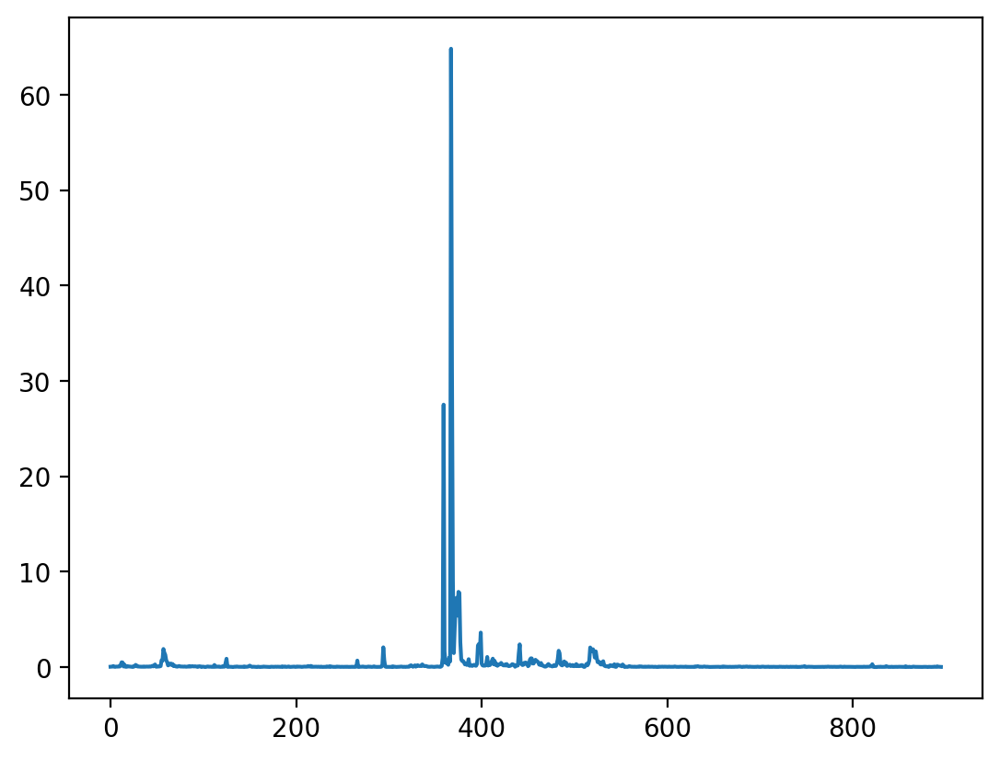

In [16]:
#output prediction track for jurkat T cells (track 4831)
predictions = model.predict_on_batch(sequence_one_hot[np.newaxis])['human'][0][:, 4831]
plt.plot(predictions)
plt.show()

## TSS coordinate

In [17]:
tss_position = np.argmax(predictions)

In [18]:
(8_075_198 - 8_054_688) / 896

22.890625

In [19]:
tss_coordinate = (tss_position * 22.890625) + 8_054_688
tss_coordinate

8063088.859375

## adjust window to enformer length and center TSS

In [20]:
tss_position = np.argmax(predictions)
tss_position

367

In [21]:
#SEQUENCE_LENGTH//2 +/- tss position 
target_interval = kipoiseq.Interval('chr10', 7_858_447, 8_251_663)
target_interval

Interval(chrom='chr10', start=7858447, end=8251663, name='', strand='.', ...)

In [22]:
model = Enformer(model_path)
fasta_extractor = FastaStringExtractor(fasta_file)
sequence = fasta_extractor.extract(target_interval.resize(SEQUENCE_LENGTH))
sequence_one_hot = one_hot_encode(sequence)

In [23]:
gpu_available = tf.test.is_gpu_available(cuda_only=False, min_cuda_compute_capability=None)
print(f"GPU available: {gpu_available}")

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


GPU available: True


2024-09-11 01:55:09.185302: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /device:GPU:0 with 20761 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:ca:00.0, compute capability: 8.6


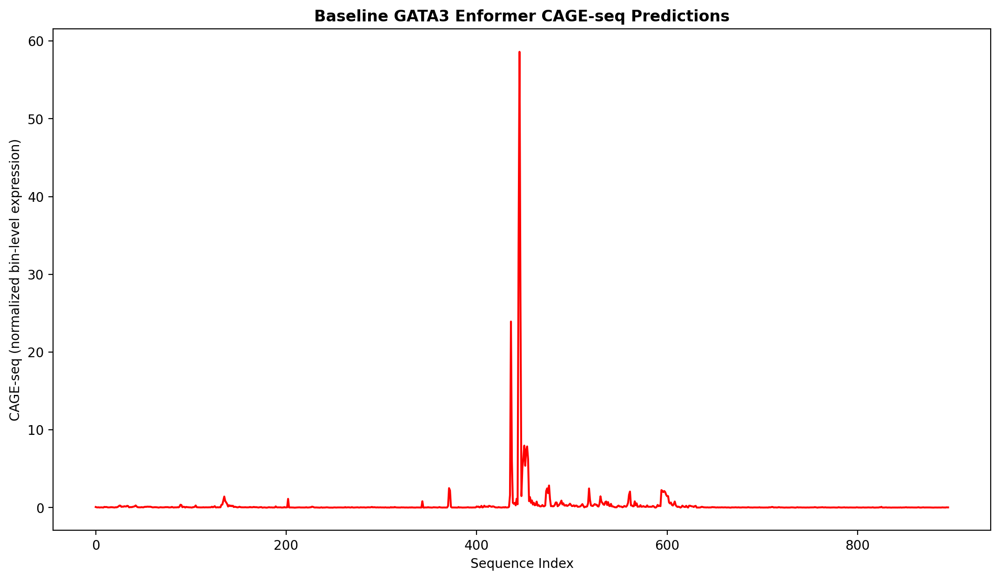

In [24]:
plt.figure(figsize=(13,7))
baseline_predictions = model.predict_on_batch(sequence_one_hot[np.newaxis])['human'][0][:, 4831]
plt.plot(baseline_predictions, color='red')
plt.title("Baseline GATA3 Enformer CAGE-seq Predictions", fontweight='bold')
plt.ylabel("CAGE-seq (normalized bin-level expression)")
plt.xlabel("Sequence Index")
plt.show()

In [25]:
tss_position = np.argmax(baseline_predictions)
tss_position

445

## tile GATA3 and make predictions for iterations (experiment 4831)

In [26]:
#assert array as a factor of 4
assert sequence_one_hot.shape[1] == 4

#create list to store iterations
iterated_results = []

for start in range(0, SEQUENCE_LENGTH, 128):
    end = min(start + 128, SEQUENCE_LENGTH)
    
    iteration_copy = np.copy(sequence_one_hot)
    iteration_copy[start:end, :] = 0.25
    iterated_results.append(iteration_copy)

In [27]:
# print each iteration or some part of it to verify the changes
for idx, iteration in enumerate(iterated_results):
    print(f"Iteration {idx}:\n", iteration[128:133, ])

Iteration 0:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]]
Iteration 1:
 [[0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]]
Iteration 2:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]]
Iteration 3:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]]
Iteration 4:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]]
Iteration 5:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]]
Iteration 6:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]]
Iteration 7:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]]
Iteration 8:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]]
Iteration 9:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]]
Iteration 10:
 [[0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]


### prediction file save

In [ ]:
predictions_list = []

for i, iteration_result in enumerate(iterated_results):
    prediction = model.predict_on_batch(np.array([iteration_result]))['human'][0][445, :]
    predictions_list.append(prediction)
    
    print(f"Processed sequence {i} / {len(iterated_results)}")

predictions_list

In [ ]:
predictions_array = np.array(predictions_list)
jurkat_predictions = np.copy(predictions_array[:, 4831])

In [ ]:
file_path = '/home/jovyan/data4/ggrama_runAI/data/jurkat_predictions.npy'
np.save(file_path, jurkat_predictions)

### load prediction file

In [28]:
# Load the .npy file
jurkat_predictions = np.load('/home/jovyan/data4/ggrama_runAI/data/jurkat_predictions.npy')

# Print the array
print(jurkat_predictions)

[58.60441 58.60441 58.60441 ... 58.60441 58.60441 58.60441]


In [29]:
len(jurkat_predictions)

3072

## calculate delta at TSS

In [30]:
baseline_CAGE_TSS = np.max(baseline_predictions)
baseline_CAGE_TSS

58.609818

In [31]:
deltas = jurkat_predictions - baseline_CAGE_TSS
deltas

array([-0.00540924, -0.00540924, -0.00540924, ..., -0.00540924,
       -0.00540924, -0.00540924], dtype=float32)

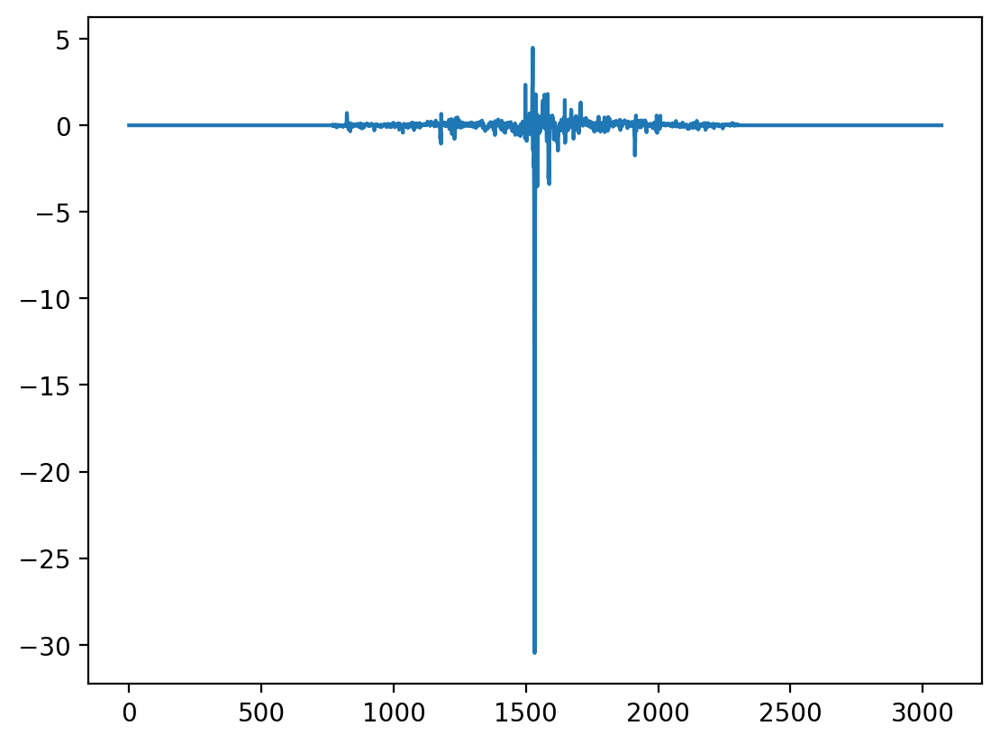

In [32]:
plt.plot(deltas)

## crop out sequence padding

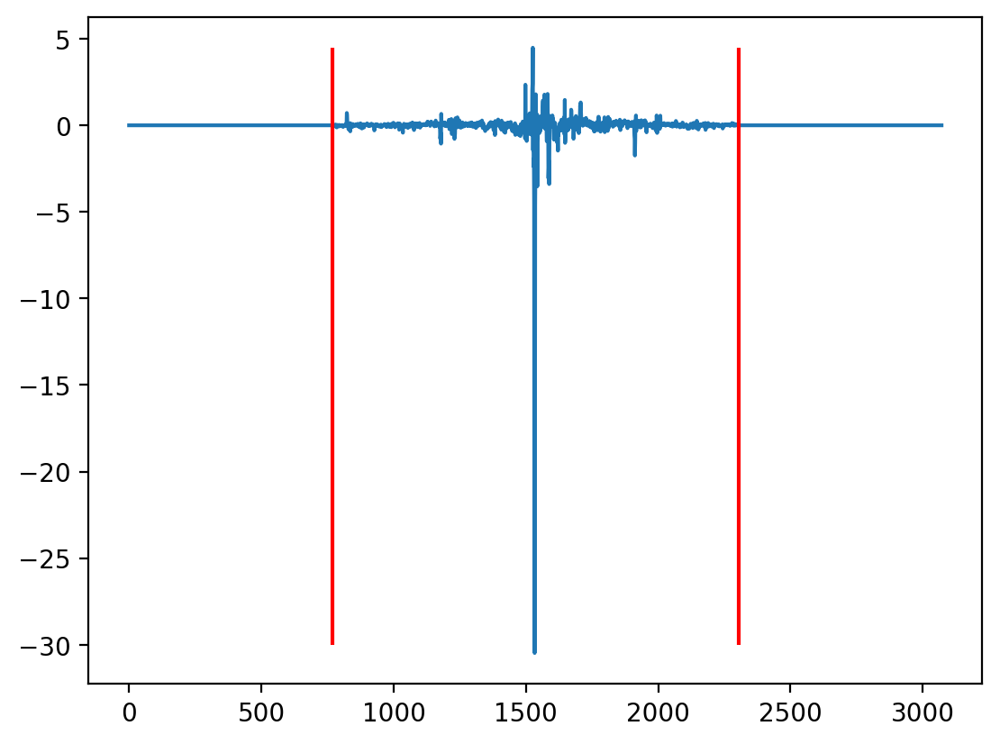

In [33]:
sequence_padding = SEQUENCE_LENGTH // 4
end_position = SEQUENCE_LENGTH - sequence_padding

plt.plot(deltas)
plt.vlines(sequence_padding / 128, -30 , np.max(deltas), color='red')
plt.vlines(end_position / 128, -30, np.max(deltas), color='red')
plt.show()

In [34]:
print(sequence_padding) 
print(end_position) 

98304
294912


In [35]:
print(98304 // 128)
print(294912 // 128)

768
2304


In [36]:
adjusted_deltas = deltas[768:2304]

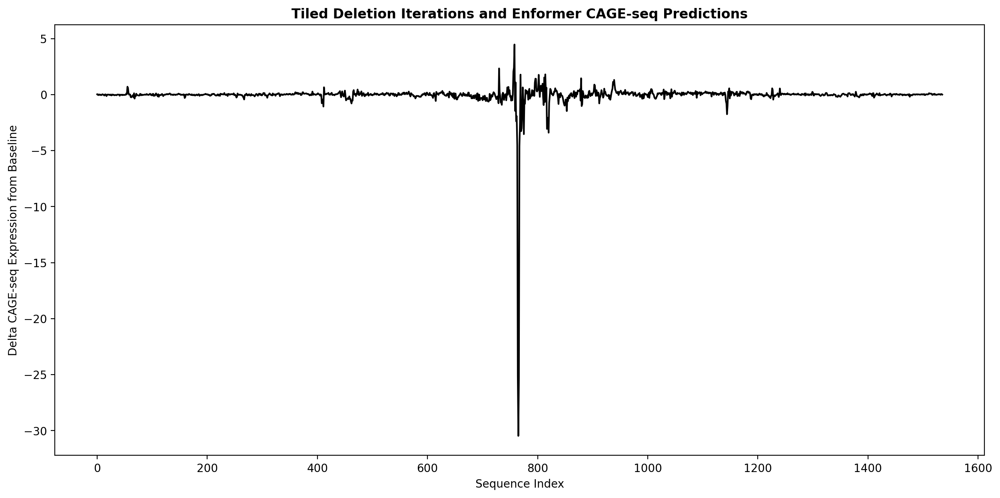

In [37]:
plt.figure(figsize=(15,7))
plt.plot(adjusted_deltas, color='black')
plt.title("Tiled Deletion Iterations and Enformer CAGE-seq Predictions", fontweight='bold')
plt.ylabel("Delta CAGE-seq Expression from Baseline")
plt.xlabel("Sequence Index")
plt.show()

## scaling (sanity check)

In [38]:
adjusted_seq_start = 7_858_447 + sequence_padding
adjusted_seq_start

7956751

In [39]:
adjusted_seq_end = 8_251_663 - sequence_padding
adjusted_seq_end

8153359

In [40]:
(8153359 - 7956751) / 1536

128.0

In [41]:
tss_coordinate = adjusted_seq_start + ((np.argmin(adjusted_deltas)) * 128)
tss_coordinate

8054671

In [42]:
np.argmin(adjusted_deltas)

765

## GATA3 functional sequences

pulled from supplementary table 7 in this paper: https://www.cell.com/ajhg/fulltext/S0002-9297(23)00092-7?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0002929723000927%3Fshowall%3Dtrue

In [43]:
regions = pd.read_csv('/home/jovyan/data4/ggrama/gata3_fs.txt', 
                      header=None, 
                      sep = '\t')
columns_to_drop = [0, 3, 4] 
regions = regions.drop(columns_to_drop, axis=1)

In [44]:
regions.rename(columns={1: 'start', 2: 'end'}, inplace=True)
print(regions)

       start      end
0    8053732  8053864
1    8053865  8054004
2    8054005  8054205
3    8054206  8054337
4    8054338  8054453
..       ...      ...
109  8241493  8242304
110  8129174  8130118
111  8227697  8229128
112  8182057  8183363
113  8331604  8332634

[114 rows x 2 columns]


In [45]:
adjusted_seq_start = int(adjusted_seq_start)
adjusted_seq_end = int(adjusted_seq_end)

conditions = (regions['start'] < adjusted_seq_start) | (regions['end'] > adjusted_seq_end)
regions = regions[~conditions]

In [46]:
#limitation here, only looking at regions contained within this 200kb window, 17 regions could not be included

In [47]:
adjusted_regions = (regions - adjusted_seq_start) // 128
adjusted_regions

,start,end
0,757,758
1,758,759
2,759,761
3,761,762
4,762,763
...,...,...
92,963,973
95,1138,1153
100,1388,1403
101,1435,1441


In [50]:
relics_array = np.array(adjusted_regions)
flattened_relics = relics_array.ravel().tolist()
unique_relics = list(set(flattened_relics))
unique_relics = sorted(unique_relics)

print(unique_relics)

[757, 758, 759, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 776, 777, 778, 779, 780, 781, 782, 783, 785, 786, 787, 788, 789, 790, 791, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 805, 811, 820, 829, 830, 832, 833, 834, 835, 836, 837, 838, 840, 842, 843, 844, 845, 847, 875, 876, 877, 879, 880, 881, 882, 883, 884, 885, 886, 888, 889, 906, 909, 910, 911, 913, 914, 915, 916, 917, 918, 919, 920, 922, 923, 925, 926, 927, 928, 930, 931, 936, 963, 973, 1138, 1153, 1347, 1354, 1388, 1403, 1435, 1441]


In [51]:
def array_to_pairs(relics_array):
    # Reshape the 2x97 array into a flat list
    flat_list = relics_array.flatten()

    pairs_list = []
    
    # Ensure the length of the flat list is even
    if len(flat_list) % 2 != 0:
        return "Error: Length of the array should be even."
    
    for i in range(0, len(flat_list), 2):
        pair = (flat_list[i], flat_list[i + 1])
        pairs_list.append(pair)
    
    return pairs_list



# Convert array to pairs
pairs = array_to_pairs(relics_array)

print(pairs)


[(757, 758), (758, 759), (759, 761), (761, 762), (762, 763), (763, 764), (764, 765), (765, 766), (766, 767), (767, 768), (768, 769), (769, 770), (770, 771), (771, 772), (772, 773), (773, 774), (774, 774), (774, 776), (776, 777), (777, 778), (778, 779), (779, 780), (780, 781), (781, 782), (782, 783), (785, 786), (786, 787), (787, 788), (788, 789), (789, 790), (790, 791), (791, 793), (793, 794), (794, 795), (795, 796), (796, 797), (797, 798), (798, 798), (798, 799), (799, 800), (800, 801), (801, 802), (802, 803), (803, 805), (829, 830), (830, 832), (832, 833), (833, 834), (834, 835), (835, 836), (836, 837), (837, 838), (838, 840), (840, 842), (842, 843), (843, 844), (844, 845), (845, 847), (875, 876), (876, 877), (877, 879), (879, 880), (880, 881), (881, 882), (882, 883), (883, 884), (884, 885), (885, 886), (886, 888), (888, 889), (906, 906), (906, 909), (909, 910), (910, 911), (911, 913), (913, 914), (914, 915), (915, 916), (916, 917), (917, 918), (918, 919), (919, 920), (920, 922), (92

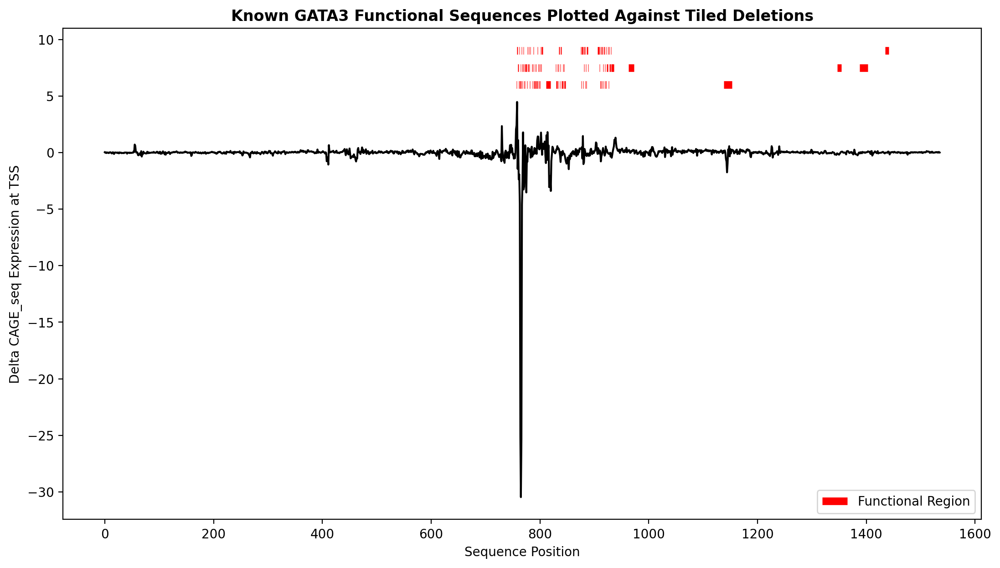

In [52]:
plt.figure(figsize=(13,7))

plt.plot(adjusted_deltas, color='black')
regions = pairs
y_min = 6
y_values = np.array([y_min]*3)*np.array([1, 1.25, 1.5])
prev_y = y_min
colors = ['red']
color_index = 0

for start, end in regions[:1]:
    # Use the current color from the list
    current_color = colors[color_index]
    
    # Draw the horizontal line with the current color
    plt.hlines(prev_y, start, end, colors=current_color, linewidth=6, label='Functional Region')
    
    # Choose next y as one of the other available y-values
    remain_y = list(y_values)
    remain_y.pop(list(y_values).index(prev_y))
    prev_y = np.random.choice(remain_y)
    
    # Update the color index (cycling through the list)
    color_index

for start, end in regions[1:]:
    # Use the current color from the list
    current_color = colors[color_index]
    
    # Draw the horizontal line with the current color
    plt.hlines(prev_y, start, end, colors=current_color, linewidth=6)
    
    # Choose next y as one of the other available y-values
    remain_y = list(y_values)
    remain_y.pop(list(y_values).index(prev_y))
    prev_y = np.random.choice(remain_y)
    
    # Update the color index (cycling through the list)
    color_index

plt.title('Known GATA3 Functional Sequences Plotted Against Tiled Deletions', fontweight='bold')
plt.xlabel('Sequence Position')
plt.ylabel('Delta CAGE_seq Expression at TSS')
plt.legend(loc='lower right')
plt.show()

In [53]:
start = []
for index in adjusted_regions:
    index = adjusted_regions['start']
    start.append(index)

print(start)

[0       757
1       758
2       759
3       761
4       762
       ... 
92      963
95     1138
100    1388
101    1435
110    1347
Name: start, Length: 97, dtype: int64, 0       757
1       758
2       759
3       761
4       762
       ... 
92      963
95     1138
100    1388
101    1435
110    1347
Name: start, Length: 97, dtype: int64]


In [54]:
end = []
for index in adjusted_regions:
    index = adjusted_regions['end']
    end.append(index)

print(end)

[0       758
1       759
2       761
3       762
4       763
       ... 
92      973
95     1153
100    1403
101    1441
110    1354
Name: end, Length: 97, dtype: int64, 0       758
1       759
2       761
3       762
4       763
       ... 
92      973
95     1153
100    1403
101    1441
110    1354
Name: end, Length: 97, dtype: int64]


## does the magnitude of the predicted expression differences look higher in the known regulatory regions versus the known non-regulatory regions that are important for GATA3 gene expression?

In [55]:
#sums values across start and end regions, absolute values 

start_indices = adjusted_regions['start']
end_indices = adjusted_regions['end']

reg_mags = []  

for start, end in zip(start_indices, end_indices):
    if start == end:
        reg_mags.append(adjusted_deltas[start])
    else:
        reg_mag = abs(sum(adjusted_deltas[start:end]) / (end - start))  
        reg_mags.append(reg_mag)

print(reg_mags)

[2.4040260314941406, 4.475360870361328, 0.17498207092285156, 2.3766250610351562, 1.9204254150390625, 4.5087890625, 25.056865692138672, 30.467273712158203, 25.351367950439453, 4.609775543212891, 2.4856834411621094, 1.7873992919921875, 3.2671737670898438, 3.003803253173828, 1.4680213928222656, 0.6470527648925781, -0.43046188, 1.9795913696289062, 0.5043716430664062, 0.8143577575683594, 0.4136962890625, 0.07112884521484375, 0.34710693359375, 0.21623992919921875, 0.22754287719726562, 0.5156631469726562, 0.35526275634765625, 0.17692184448242188, 0.16662979125976562, 0.0673675537109375, 0.40261077880859375, 0.06556129455566406, 0.3470420837402344, 0.11500167846679688, 1.0764999389648438, 1.4256324768066406, 1.4112663269042969, 0.33581924, 0.3358192443847656, 0.27840423583984375, 0.362884521484375, 0.5364303588867188, 1.7686996459960938, 0.20294761657714844, 0.026031494140625, 0.2591533660888672, 0.5646018981933594, 0.3307533264160156, 0.38663482666015625, 0.2966880798339844, 0.050975799560546

## background distribution

In [56]:
data = adjusted_deltas
regions = [(adjusted_regions['start'].iloc[i], adjusted_regions['end'].iloc[i]) for i in range(len(adjusted_regions))]

num_datasets = 100

# Function to generate randomized regions with consistent length but different starting positions
def generate_shifted_randomized_regions(data, regions):
    randomized_regions = []
    
    for start, end in regions:
        region_length = end - start
        
        # List comprehension to generate the shifted starting positions
        random_starts = [np.random.randint(0, len(data) - region_length) for _ in range(num_datasets)]
        
        # Create the shifted regions
        shifted_regions = [(random_start, random_start + region_length) for random_start in random_starts]
        
        randomized_regions.append(shifted_regions)
    
    return randomized_regions

# Generate randomized regions with consistent region lengths but different starting positions
shifted_randomized_regions = generate_shifted_randomized_regions(adjusted_deltas, regions)

In [57]:
shifted_randomized_regions

[[(965, 966),
  (811, 812),
  (787, 788),
  (1266, 1267),
  (1323, 1324),
  (1448, 1449),
  (1212, 1213),
  (603, 604),
  (1075, 1076),
  (106, 107),
  (1277, 1278),
  (1356, 1357),
  (1509, 1510),
  (1422, 1423),
  (870, 871),
  (531, 532),
  (424, 425),
  (1150, 1151),
  (1238, 1239),
  (619, 620),
  (1381, 1382),
  (1233, 1234),
  (1089, 1090),
  (834, 835),
  (1492, 1493),
  (1308, 1309),
  (369, 370),
  (1092, 1093),
  (1343, 1344),
  (235, 236),
  (1183, 1184),
  (1468, 1469),
  (815, 816),
  (351, 352),
  (229, 230),
  (0, 1),
  (1248, 1249),
  (254, 255),
  (168, 169),
  (495, 496),
  (372, 373),
  (1534, 1535),
  (749, 750),
  (620, 621),
  (303, 304),
  (877, 878),
  (1430, 1431),
  (411, 412),
  (577, 578),
  (1263, 1264),
  (1070, 1071),
  (1165, 1166),
  (1328, 1329),
  (1136, 1137),
  (1174, 1175),
  (1002, 1003),
  (188, 189),
  (825, 826),
  (782, 783),
  (212, 213),
  (1370, 1371),
  (870, 871),
  (1283, 1284),
  (207, 208),
  (276, 277),
  (807, 808),
  (869, 870),
  

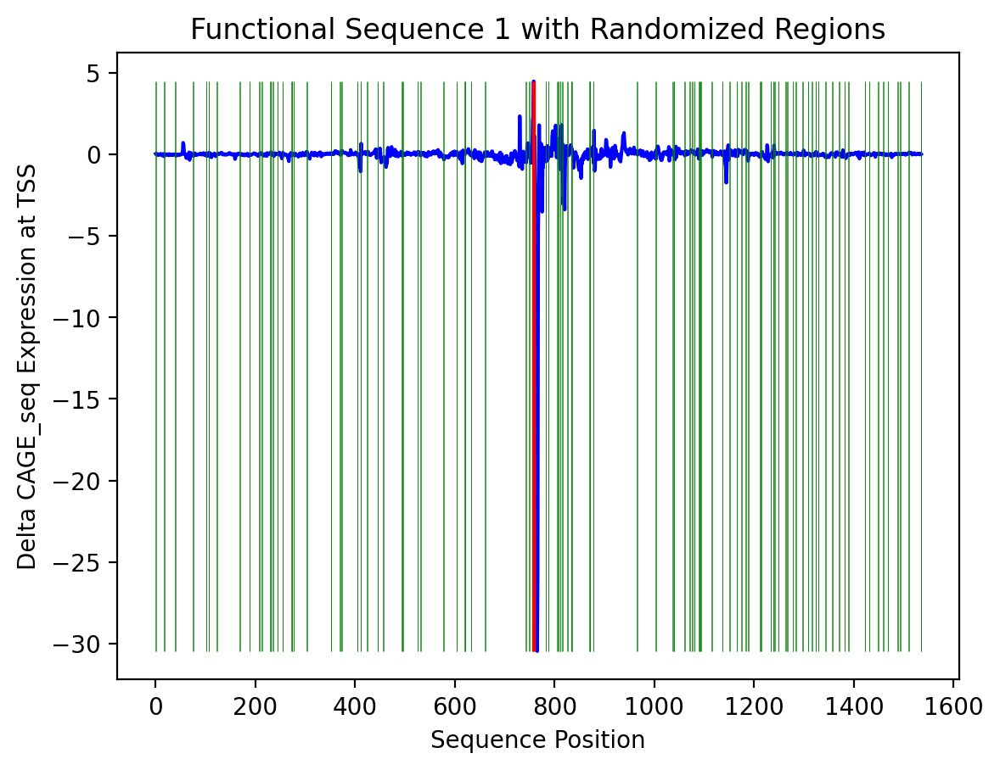

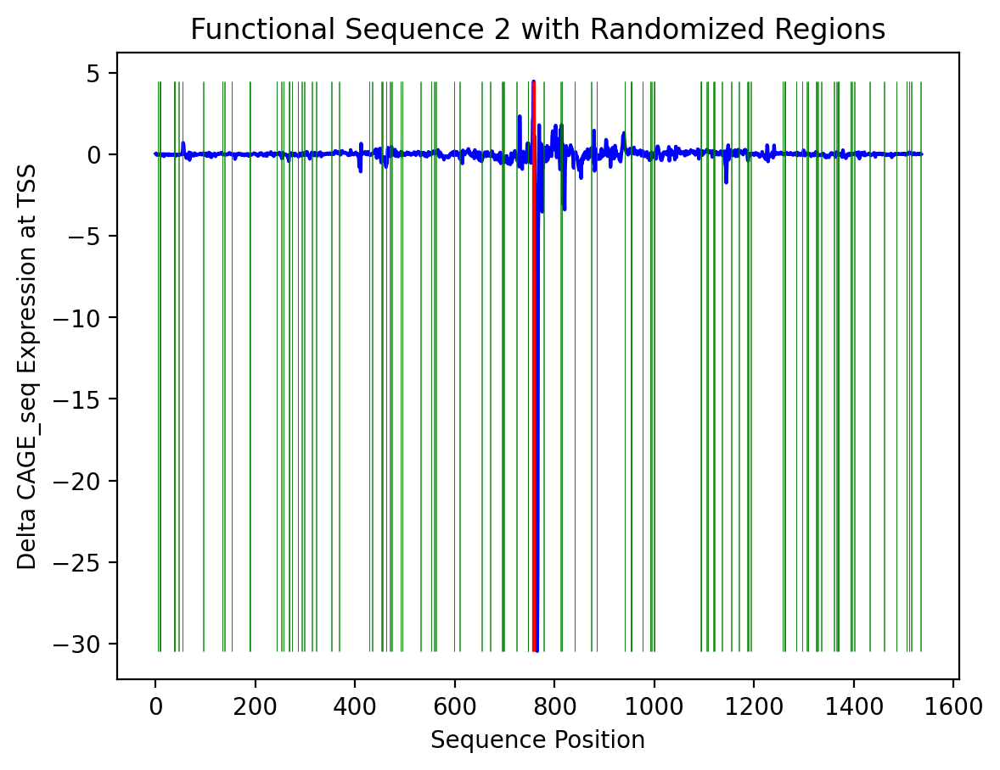

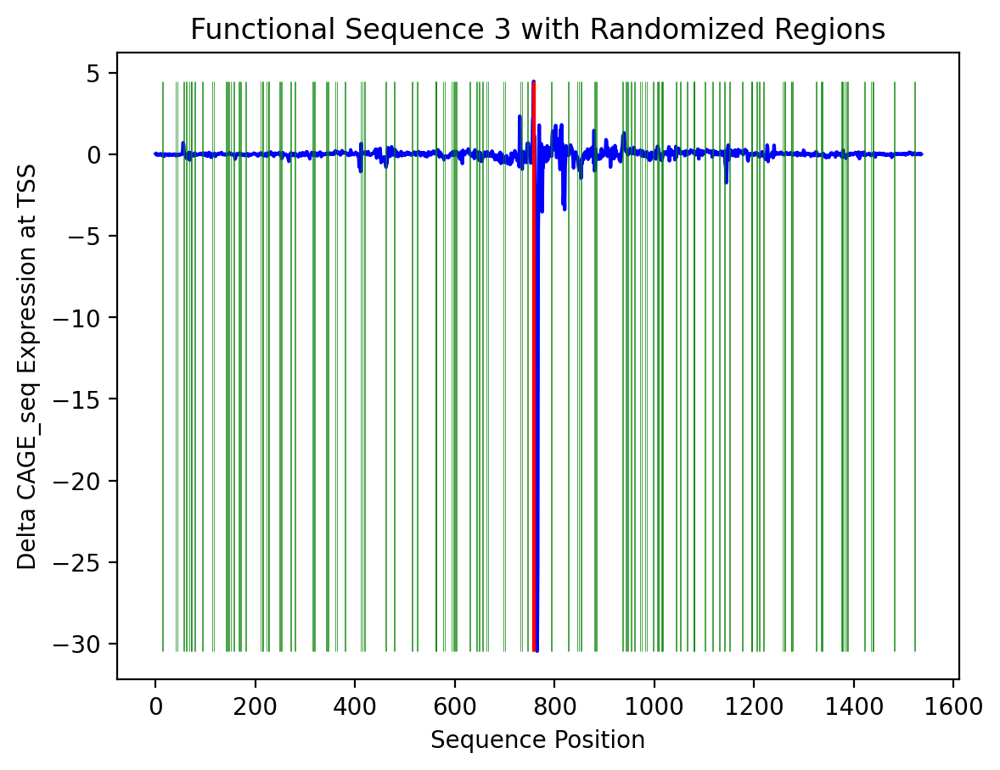

In [58]:
# Plot the first 3 iterations of randomized regions against the original data and known GATA3 functional sequences
for i in range(3):
    randomized_regions = shifted_randomized_regions[i]  # Access randomized regions for the current iteration

    plt.plot(adjusted_deltas, color='blue')

    # Plot known GATA3 functional sequences
    for start, end in regions:
        plt.vlines(x=[start, end], ymin=np.min(adjusted_deltas), ymax=np.max(adjusted_deltas), color='red', linewidth=1.2, label='Known Sequence')
        break
        

    # Plot randomized regions for the current iteration in green
    for start, end in randomized_regions:
        plt.vlines(x=[start, end], ymin=np.min(adjusted_deltas), ymax=np.max(adjusted_deltas), color='green', linewidth=0.25, label='Randomized Regions')


    plt.title(f'Functional Sequence {i+1} with Randomized Regions')
    plt.xlabel('Sequence Position')
    plt.ylabel('Delta CAGE_seq Expression at TSS')
    plt.show()

In [59]:
mean_across_iterations = []

for region_idx in range(len(regions)):
    region_means = []

    for i in range(num_datasets):
        if i < len(shifted_randomized_regions):
            randomized_regions = shifted_randomized_regions[i]
            if region_idx < len(randomized_regions):
                start, end = randomized_regions[region_idx]
                region_values = adjusted_deltas[start:end]
                
                # Check if region_values is not empty before calculating mean
                if len(region_values) > 0:
                    region_mean = np.mean(region_values)
                    region_means.append(region_mean)
    
    if region_means:  # Check if region_means list is not empty
        mean_across_iterations.append(np.mean(region_means))
    else:
        mean_across_iterations.append(0)  # Placeholder value if no data available for the region

# The list mean_across_iterations now contains the mean for each region across all iterations

mean_across_iterations = [abs(value) for value in mean_across_iterations]

In [60]:
from scipy.stats import ttest_rel

expected_means = mean_across_iterations
observed_means = reg_mags

t_stat, p_val = ttest_rel(expected_means, observed_means)

if p_val < 0.05:
    print("The observed region means are statistically significant.")
else:
    print('The observed region means are not statistically significant.')

The observed region means are statistically significant.


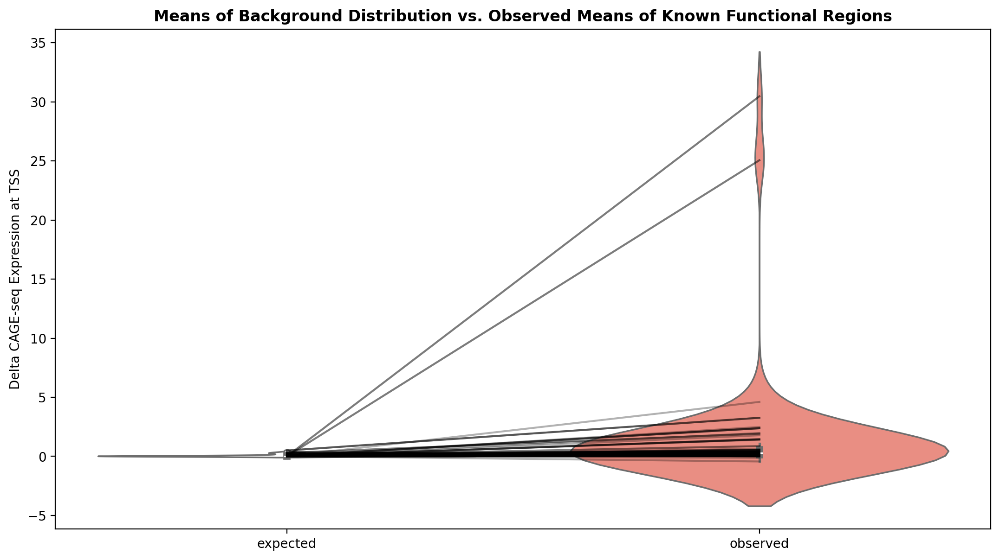

In [61]:
plt.figure(figsize=(13,7))

def run_baseline_ttest(expected_means, observed_means, TEST_NAME, out_plots, log_file, alloc=''):
 
    # Create the violin plot
    df = pd.DataFrame({"expected": expected_means, "observed": observed_means})
    sns.violinplot(data=df, palette=('white', 'salmon'))
    
    # Connect paired data points with lines
    for i in np.random.randint(0, len(expected_means), 100):
        plt.plot([0, 1], [expected_means[i], observed_means[i]], 'k-', alpha=0.3)
    
    plt.title('Means of Background Distribution vs. Observed Means of Known Functional Regions', fontweight='bold')
    plt.ylabel('Delta CAGE-seq Expression at TSS')
    plt.show()

    # Paired t-test calculation
    t_stat, p_val = stats.ttest_rel(observed_means, expected_means)

    # Print results and save to log file
    print("\nMean expected MSE:", np.mean(expected_means), "Mean observed MSE:", np.mean(observed_means),
          file=log_file, flush=True)
    print(f"T-statistic: {t_stat}", file=log_file, flush=True)
    print(f"P-value: {p_val}\n", file=log_file, flush=True)
    print(f"Saved ", out_plots + f'{TEST_NAME}{alloc}_obsVSexp_violin.png\n', file=log_file, flush=True)
run_baseline_ttest(expected_means, observed_means, "Test", "output_plots/", log_file=open("log.txt", "w"))

## characterizing uncalled peaks through quantifying uncertainty in models predictions by creating a jittered data set

In [62]:
# had to split up jitters because it was too much to process at once
jitter_128 = kipoiseq.Interval('chr10', 7_858_447 + 128, 8_251_663 + 128)
jitter_256 = kipoiseq.Interval('chr10', 7_858_447 + 256, 8_251_663 + 256)
jitter_128_neg = kipoiseq.Interval('chr10', 7_858_447 - 128, 8_251_663 - 128)
jitter_256_neg = kipoiseq.Interval('chr10', 7_858_447 - 256, 8_251_663 - 256)

In [63]:
j128_seq = fasta_extractor.extract(jitter_128.resize(SEQUENCE_LENGTH))
j256_seq = fasta_extractor.extract(jitter_256.resize(SEQUENCE_LENGTH))
j128_neg_seq = fasta_extractor.extract(jitter_128_neg.resize(SEQUENCE_LENGTH))
j256_neg_seq = fasta_extractor.extract(jitter_256_neg.resize(SEQUENCE_LENGTH))

In [64]:
one_hot_j128 = one_hot_encode(j128_seq)
one_hot_j256 = one_hot_encode(j256_seq)
one_hot_j128_neg = one_hot_encode(j128_neg_seq)
one_hot_j256_neg = one_hot_encode(j256_neg_seq)

In [65]:
# iterations for each jitter

#assert array as a factor of 4
assert one_hot_j128.shape[1] == 4

#create list to store iterations
j128_iteration = []

for start in range(0, SEQUENCE_LENGTH, 128):
    end = min(start + 128, SEQUENCE_LENGTH)
    
    iteration_copy = np.copy(one_hot_j128)
    iteration_copy[start:end, :] = 0.25
    j128_iteration.append(iteration_copy)
    

#assert array as a factor of 4
assert one_hot_j256.shape[1] == 4

#create list to store iterations
j256_iteration = []

for start in range(0, SEQUENCE_LENGTH, 128):
    end = min(start + 128, SEQUENCE_LENGTH)
    
    iteration_copy = np.copy(one_hot_j256)
    iteration_copy[start:end, :] = 0.25
    j256_iteration.append(iteration_copy)
    
    
#assert array as a factor of 4
assert one_hot_j128_neg.shape[1] == 4

#create list to store iterations
j128_neg_iteration = []

for start in range(0, SEQUENCE_LENGTH, 128):
    end = min(start + 128, SEQUENCE_LENGTH)
    
    iteration_copy = np.copy(one_hot_j128_neg)
    iteration_copy[start:end, :] = 0.25
    j128_neg_iteration.append(iteration_copy)
    
    
#assert array as a factor of 4
assert one_hot_j256_neg.shape[1] == 4

#create list to store iterations
j256_neg_iteration = []

for start in range(0, SEQUENCE_LENGTH, 128):
    end = min(start + 128, SEQUENCE_LENGTH)
    
    iteration_copy = np.copy(one_hot_j256_neg)
    iteration_copy[start:end, :] = 0.25
    j256_neg_iteration.append(iteration_copy)

In [66]:
# print each iteration or some part of it to verify the changes
for idx, iteration in enumerate(j256_neg_iteration):
    print(f"Iteration {idx}:\n", iteration[0:128, ])

Iteration 0:
 [[0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.2

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



[[1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1.

### jitter prediction file save

In [ ]:
predictions_j128 = []

for i, iteration_result in enumerate(j128_iteration):
    prediction = model.predict_on_batch(np.array([iteration_result]))['human'][0][444, :]
    predictions_j128.append(prediction)
    
    print(f"Processed sequence {i} / {len(iterated_results)}")

predictions_j128

In [ ]:
predictions_j256 = []

for i, iteration_result in enumerate(j256_iteration):
    prediction = model.predict_on_batch(np.array([iteration_result]))['human'][0][443, :]
    predictions_j256.append(prediction)
    
    print(f"Processed sequence {i} / {len(iterated_results)}")

predictions_j256

In [ ]:
predictions_j128_neg = []

for i, iteration_result in enumerate(j128_neg_iteration):
    
    prediction = model.predict_on_batch(np.array([iteration_result]))['human'][0][446, :]
    predictions_j128_neg.append(prediction)
    
    print(f"Processed sequence {i} / {len(iterated_results)}")

predictions_j128_neg

In [ ]:
predictions_j256_neg = []

for i, iteration_result in enumerate(j256_neg_iteration):
    prediction = model.predict_on_batch(np.array([iteration_result]))['human'][0][447, :]
    predictions_j256_neg.append(prediction)
    
    print(f"Processed sequence {i} / {len(iterated_results)}")

predictions_j256_neg

In [ ]:
j128 = np.array(predictions_j128)
j128 = np.copy(j128[:, 4831])

j256 = np.array(predictions_j256)
j256 = np.copy(j256[:, 4831])

j128_neg = np.array(predictions_j128_neg)
j128_neg = np.copy(j128_neg[:, 4831])

j256_neg = np.array(predictions_j256_neg)
j256_neg = np.copy(j256_neg[:, 4831])

In [ ]:
file_path = '/home/jovyan/data4/ggrama_runAI/data/j128.npy'
np.save(file_path, j128)

In [ ]:
file_path = '/home/jovyan/data4/ggrama_runAI/data/j256.npy'
np.save(file_path, j256)

In [ ]:
file_path = '/home/jovyan/data4/ggrama_runAI/data/j128_neg.npy'
np.save(file_path, j128_neg)

In [ ]:
file_path = '/home/jovyan/data4/ggrama_runAI/data/j256_neg.npy'
np.save(file_path, j256_neg)

## jitter file load

In [82]:
# Load the .npy file
j128_saved = np.load('/home/jovyan/data4/ggrama_runAI/data/j128.npy')

# Print the array
print(j128_saved)

[58.60742 58.60742 58.60742 ... 58.60742 58.60742 58.60742]


In [83]:
# Load the .npy file
j256_saved = np.load('/home/jovyan/data4/ggrama_runAI/data/j256.npy')

# Print the array
print(j256_saved)

[58.62871 58.62871 58.62871 ... 58.62871 58.62871 58.62871]


In [84]:
# Load the .npy file
j128_neg_saved = np.load('/home/jovyan/data4/ggrama_runAI/data/j128_neg.npy')

# Print the array
print(j128_neg_saved)

[58.504726 58.504726 58.504726 ... 58.504726 58.504726 58.504726]


In [85]:
# Load the .npy file
j256_neg_saved = np.load('/home/jovyan/data4/ggrama_runAI/data/j256_neg.npy')

# Print the array
print(j256_neg_saved)

[58.41545 58.41545 58.41545 ... 58.41545 58.41545 58.41545]


In [86]:
trimmed_predictions_j128 = np.copy(j128_saved[769:2301])
trimmed_predictions_j256 = np.copy(j256_saved[768:2300])
trimmed_predictions_j128_neg = np.copy(j128_neg_saved[771:2303])
trimmed_predictions_j256_neg = np.copy(j256_neg_saved[772:2304])

In [87]:
print(len(trimmed_predictions_j128))
print(len(trimmed_predictions_j256))
print(len(trimmed_predictions_j128_neg))
print(len(trimmed_predictions_j256_neg))

1532
1532
1532
1532


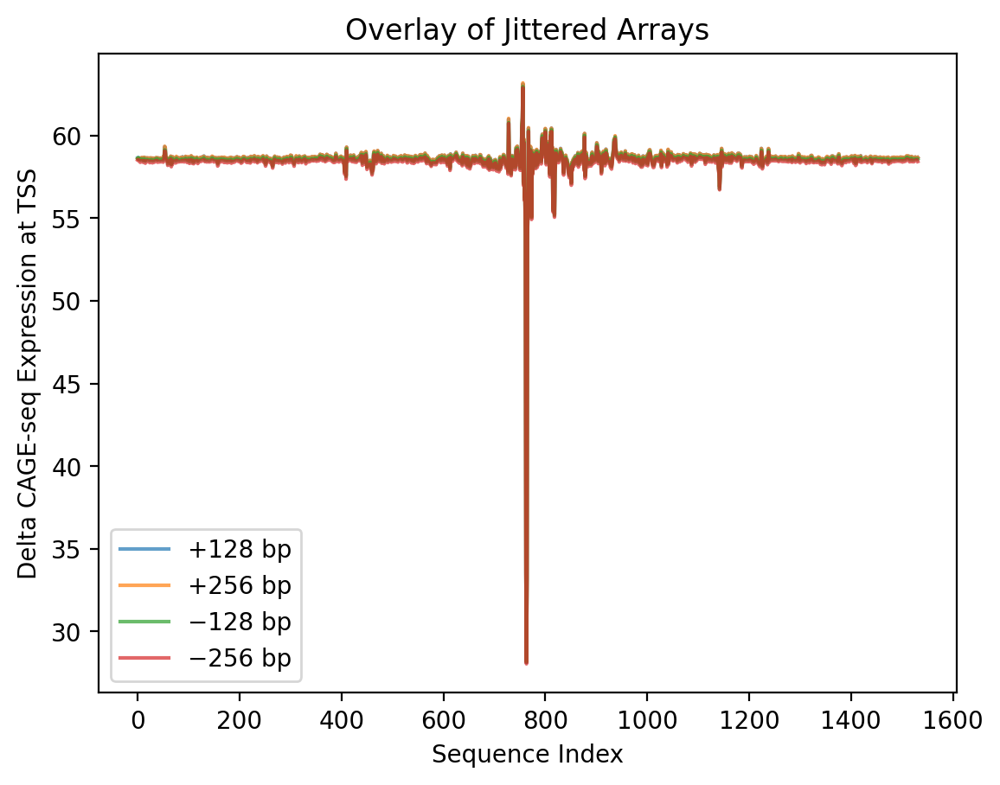

In [90]:
x = np.arange(len(trimmed_predictions_j128))

plt.plot(x, trimmed_predictions_j128, label='+128 bp', alpha=0.7)
plt.plot(x, trimmed_predictions_j256, label='+256 bp', alpha=0.7)
plt.plot(x, trimmed_predictions_j128_neg, label='−128 bp', alpha=0.7)
plt.plot(x, trimmed_predictions_j256_neg, label='−256 bp', alpha=0.7)


plt.xlabel('Sequence Index')
plt.ylabel('Delta CAGE-seq Expression at TSS')
plt.title('Overlay of Jittered Arrays')

plt.legend()

plt.show()

In [91]:
trimmed_jitters = [trimmed_predictions_j128, trimmed_predictions_j256, trimmed_predictions_j128_neg, trimmed_predictions_j256_neg]

In [92]:
jitter_deltas = []

for array in trimmed_jitters:
    delta = array - baseline_CAGE_TSS
    jitter_deltas.append(delta)

jitter_deltas = np.array(jitter_deltas)
print(jitter_deltas)

[[ 0.02455902 -0.04887772  0.02799606 ...  0.04943466  0.02525711
   0.05113602]
 [-0.015728   -0.05857849  0.00031281 ...  0.06156921  0.03005219
   0.05580139]
 [ 0.00561523 -0.00989914  0.03268814 ... -0.05152893 -0.07628632
  -0.04740906]
 [-0.10477829 -0.12476349 -0.08589935 ... -0.13822937 -0.10177612
  -0.18743896]]


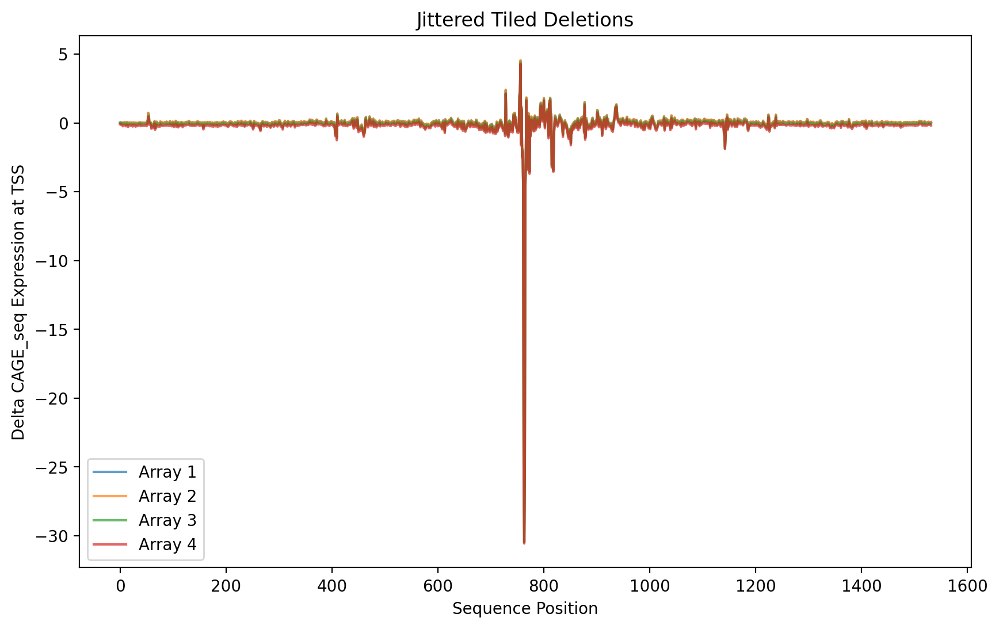

In [93]:
x = np.arange(len(trimmed_predictions_j128))

plt.figure(figsize=(10, 6))

for i, array in enumerate(jitter_deltas):
    plt.plot(x, array, label=f'Array {i + 1}', alpha=0.7)

plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.title('Jittered Tiled Deletions')
plt.xlabel('Sequence Position')
plt.ylabel('Delta CAGE_seq Expression at TSS')

plt.show()

## standard error of mean

In [94]:
df = pd.DataFrame(jitter_deltas)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(df)

       0         1         2         3         4         5         6     \
0  0.024559 -0.048878  0.027996  0.023464  0.015141 -0.015907 -0.013905   
1 -0.015728 -0.058578  0.000313  0.011189  0.016819 -0.027649  0.021671   
2  0.005615 -0.009899  0.032688 -0.037403 -0.027992 -0.115753 -0.101044   
3 -0.104778 -0.124763 -0.085899 -0.151936 -0.145897 -0.237209 -0.221237   

       7         8         9         10        11        12        13    \
0  0.016754  0.046745  0.033413  0.024204 -0.076729  0.017929  0.066704   
1  0.030586  0.057667  0.048695  0.029591 -0.060951  0.018200  0.067089   
2 -0.037983 -0.036045 -0.072254 -0.065842 -0.150009 -0.078407 -0.030354   
3 -0.147457 -0.146217 -0.163235 -0.178513 -0.241234 -0.167027 -0.140034   

       14        15        16        17        18        19        20    \
0 -0.014816 -0.103397  0.015568  0.025562  0.023689  0.011955  0.015038   
1 -0.001442 -0.085678  0.021107  0.025375  0.035381  0.008873  0.026627   
2 -0.085476 -0.172787 -

In [95]:
#calculate sem across arrays
jitter_2d = np.vstack([trimmed_predictions_j128, trimmed_predictions_j256, trimmed_predictions_j128_neg, trimmed_predictions_j256_neg])
print(jitter_2d)

# ddof = 1 since data is subset of population
std_devs = np.std(jitter_2d, axis=0, ddof=1)

# Number of arrays (samples)
n = 4

# Calculate the standard error of the mean at each position
sem = std_devs / np.sqrt(n)

# Print the SEM values
print("Standard Error of the Mean at each position:", sem)

[[58.634377 58.56094  58.637814 ... 58.659252 58.635075 58.660954]
 [58.59409  58.55124  58.61013  ... 58.671387 58.63987  58.66562 ]
 [58.615433 58.59992  58.642506 ... 58.55829  58.53353  58.56241 ]
 [58.50504  58.485054 58.52392  ... 58.47159  58.50804  58.42238 ]]
Standard Error of the Mean at each position: [0.02860735 0.02385549 0.0275016  ... 0.04694552 0.03409784 0.05702294]


In [96]:
min_value = np.min(jitter_deltas)
min_indices = np.unravel_index(np.where(jitter_deltas == min_value), jitter_deltas.shape)
print(min_indices)

(array([[0],
       [0]]), array([[  3],
       [763]]))


In [97]:
# Parameters
confidence = 0.95
n = jitter_deltas.shape[0]
dof = n - 1

# Mean, SEM, and t critical value calculation
means = np.mean(jitter_deltas, axis=0)
stderr = stats.sem(jitter_deltas, axis=0)
t_critical = stats.t.ppf((1 + confidence) / 2., dof)

# Confidence Intervals
margin_of_error = t_critical * stderr
ci_lower = means - margin_of_error
ci_upper = means + margin_of_error

# Results
print("Means for each column:", means)
print("Confidence Intervals for each column:", (ci_lower, ci_upper))

Means for each column: [-0.02258301 -0.06052971 -0.00622559 ... -0.01968861 -0.03068829
 -0.03197765]
Confidence Intervals for each column: (array([-0.11362436, -0.1364485 , -0.09374796, ..., -0.16909018,
       -0.13920283, -0.21345009], dtype=float32), array([0.06845835, 0.01538909, 0.08129679, ..., 0.12971297, 0.07782625,
       0.14949478], dtype=float32))


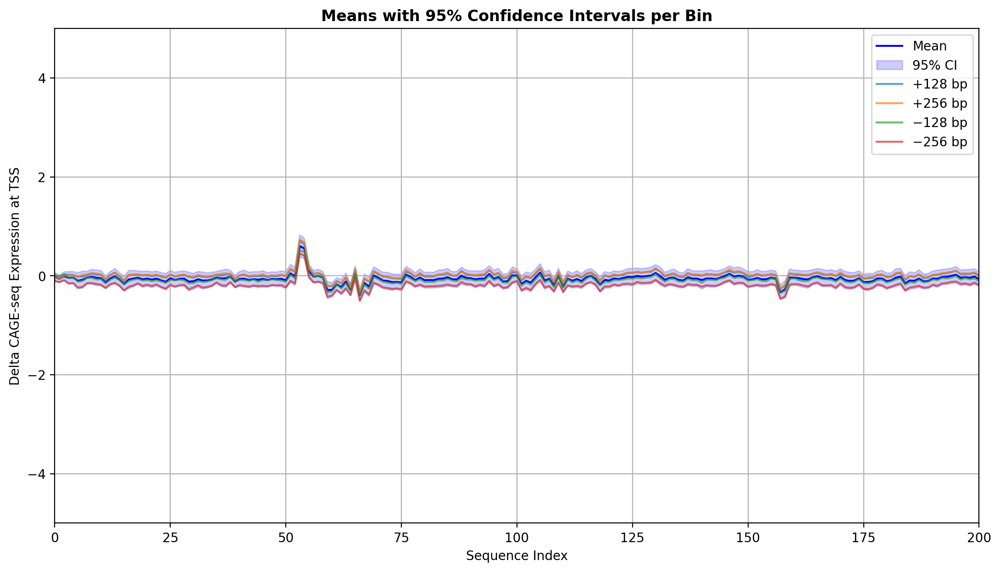

In [98]:
plt.figure(figsize=(13, 7))
plt.plot(x, means, label='Mean', color='b')
plt.fill_between(x, ci_lower, ci_upper, color='b', alpha=0.2, label='95% CI')
labels = ('+128 bp', '+256 bp', '−128 bp', '−256 bp')

for i, array in enumerate(jitter_deltas):
    plt.plot(x, array, label=labels[i], alpha=0.7)

plt.xlabel('Sequence Index')
plt.ylabel('Delta CAGE-seq Expression at TSS')
plt.title('Means with 95% Confidence Intervals per Bin', fontweight='bold')
plt.legend()
plt.xlim([0, 200])
plt.ylim([-5, 5])
plt.grid(True)
plt.show()

In [99]:
t_stat = means / stderr

# Calculate the p-values for each column
p_values = stats.t.sf(np.abs(t_stat), dof) * 2  # Two-tailed p-value

# Results
print("T-statistics for each column:", t_stat)
print("P-values for each column:", p_values)

T-statistics for each column: [-0.78941274 -2.5373497  -0.22637175 ... -0.4193927  -0.9000068
 -0.5607858 ]
P-values for each column: [0.48751012 0.08487609 0.83545926 ... 0.70315032 0.43444795 0.61410076]


In [101]:
import statsmodels
from statsmodels.stats.multitest import multipletests
FDR = statsmodels.stats.multitest.multipletests(p_values, 
                                          alpha=0.3, 
                                          method='fdr_bh', 
                                          maxiter=1, 
                                          is_sorted=False, 
                                          returnsorted=False)

In [102]:
q_values = FDR[1]
q_values

array([0.66447108, 0.26420754, 0.90342871, ..., 0.81793948, 0.62849316,
       0.756272  ])

In [103]:
significant_q = np.where(q_values <= 0.3)[0]

# Output the significant column indexes
print(significant_q)

[   1   11   15   39   53   54   59   60   61   62   64   66   67   68
   73   74   75   97  101  103  108  110  118  157  158  175  184  188
  203  213  214  215  218  221  235  250  251  252  262  263  264  265
  277  283  284  285  290  304  306  307  308  316  322  330  358  361
  363  371  372  384  389  403  406  407  408  409  410  424  438  439
  441  443  445  446  448  450  451  452  453  454  455  456  457  458
  459  460  461  462  463  464  468  471  473  477  478  479  483  484
  491  529  538  542  554  556  560  564  567  573  574  575  576  577
  578  579  580  581  582  583  584  585  586  597  606  607  608  610
  611  612  613  614  615  622  623  624  625  627  630  631  632  636
  637  638  642  644  645  647  650  651  652  653  654  655  661  668
  671  672  673  674  675  676  678  679  680  681  682  683  686  687
  690  693  694  695  696  697  698  699  700  701  702  703  704  705
  706  707  708  709  710  712  713  715  716  718  719  721  722  723
  724 

In [104]:
significant_p = np.where(p_values <= 0.05)[0]

# Output the significant column indexes
print(significant_p)

[  11   15   53   54   59   60   61   62   64   66   68  101  108  110
  118  157  158  235  250  251  252  263  264  265  284  290  306  307
  330  358  389  406  407  408  409  410  438  439  441  443  446  448
  450  451  452  453  454  455  456  457  458  459  460  461  462  463
  464  468  471  473  478  479  484  542  564  567  573  574  575  576
  577  581  582  583  584  585  586  607  608  611  612  613  614  622
  624  625  632  636  637  638  642  644  645  647  650  651  652  653
  654  655  661  674  675  676  678  679  680  682  683  686  687  690
  693  694  695  696  697  698  699  700  701  703  704  705  706  707
  708  709  710  712  713  715  716  718  722  723  724  725  726  727
  728  729  731  732  733  737  741  743  745  747  748  750  751  752
  754  755  756  757  758  759  760  761  762  763  764  765  766  767
  768  769  770  771  772  773  774  775  776  778  779  780  781  782
  783  784  785  786  788  791  792  793  794  795  796  797  798  799
  800 

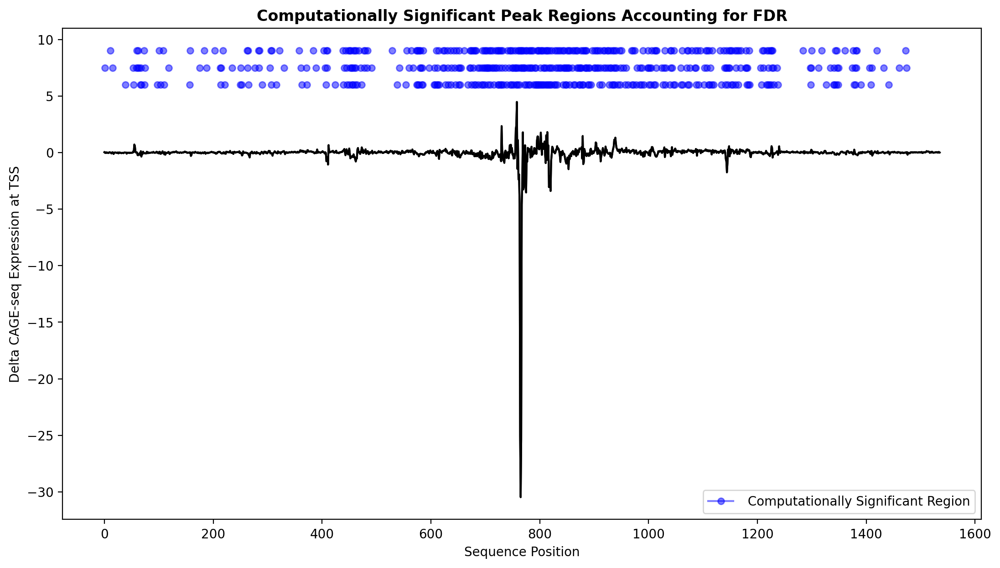

In [105]:
plt.figure(figsize=(13, 7))

# Plot the main data
plt.plot(adjusted_deltas, color='black')

x_coordinates = significant_q
y_min = 6
y_values = np.array([y_min]*3)*np.array([1, 1.25, 1.5])
prev_y = y_min
colors = ['blue']  

# Plot the main data
plt.plot(adjusted_deltas, color='black')

for x in x_coordinates:
    # Choose a new y-coordinate from the available y-values
    if prev_y is not None:  # If there was a previous y-coordinate
        remain_y = list(y_values)  # Create a list of remaining y-values
        remain_y.remove(prev_y)  # Remove the last used y-value from the list

        # Randomly select a new y-value from the remaining options
        current_y = np.random.choice(remain_y)
    else:
        # If no previous y-coordinate exists (first iteration):
        current_y = np.random.choice(y_values)

    plt.plot(x, current_y, marker='o', color='blue', markersize=5, alpha = 0.5, label=' Computationally Significant Region' if x == x_coordinates[0] else "")
    
    # Update prev_y for the next iteration
    prev_y = current_y

# Bold the title and labels
plt.title('Computationally Significant Peak Regions Accounting for FDR', fontweight='bold')
plt.xlabel('Sequence Position')
plt.ylabel('Delta CAGE-seq Expression at TSS')

# Bold the legend labels
plt.legend(loc = 'lower right')

plt.show()


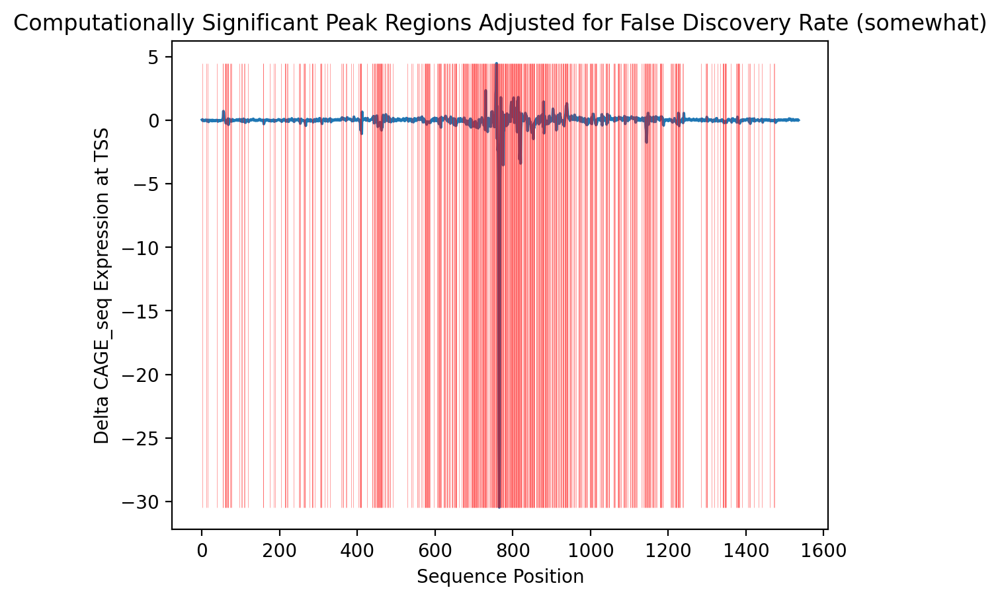

In [106]:
plt.plot(adjusted_deltas)
plt.vlines(significant_q, 
           np.min(adjusted_deltas), 
           np.max(adjusted_deltas), 
           color='red',
           linewidth=0.25, 
           alpha=0.5)
plt.title('Computationally Significant Peak Regions Adjusted for False Discovery Rate (somewhat)')
plt.xlabel('Sequence Position')
plt.ylabel('Delta CAGE_seq Expression at TSS')
plt.show()

In [107]:
significant_columns = np.where(p_values <= 0.05)[0]

# Output the significant column indexes
print(significant_columns)

[  11   15   53   54   59   60   61   62   64   66   68  101  108  110
  118  157  158  235  250  251  252  263  264  265  284  290  306  307
  330  358  389  406  407  408  409  410  438  439  441  443  446  448
  450  451  452  453  454  455  456  457  458  459  460  461  462  463
  464  468  471  473  478  479  484  542  564  567  573  574  575  576
  577  581  582  583  584  585  586  607  608  611  612  613  614  622
  624  625  632  636  637  638  642  644  645  647  650  651  652  653
  654  655  661  674  675  676  678  679  680  682  683  686  687  690
  693  694  695  696  697  698  699  700  701  703  704  705  706  707
  708  709  710  712  713  715  716  718  722  723  724  725  726  727
  728  729  731  732  733  737  741  743  745  747  748  750  751  752
  754  755  756  757  758  759  760  761  762  763  764  765  766  767
  768  769  770  771  772  773  774  775  776  778  779  780  781  782
  783  784  785  786  788  791  792  793  794  795  796  797  798  799
  800 

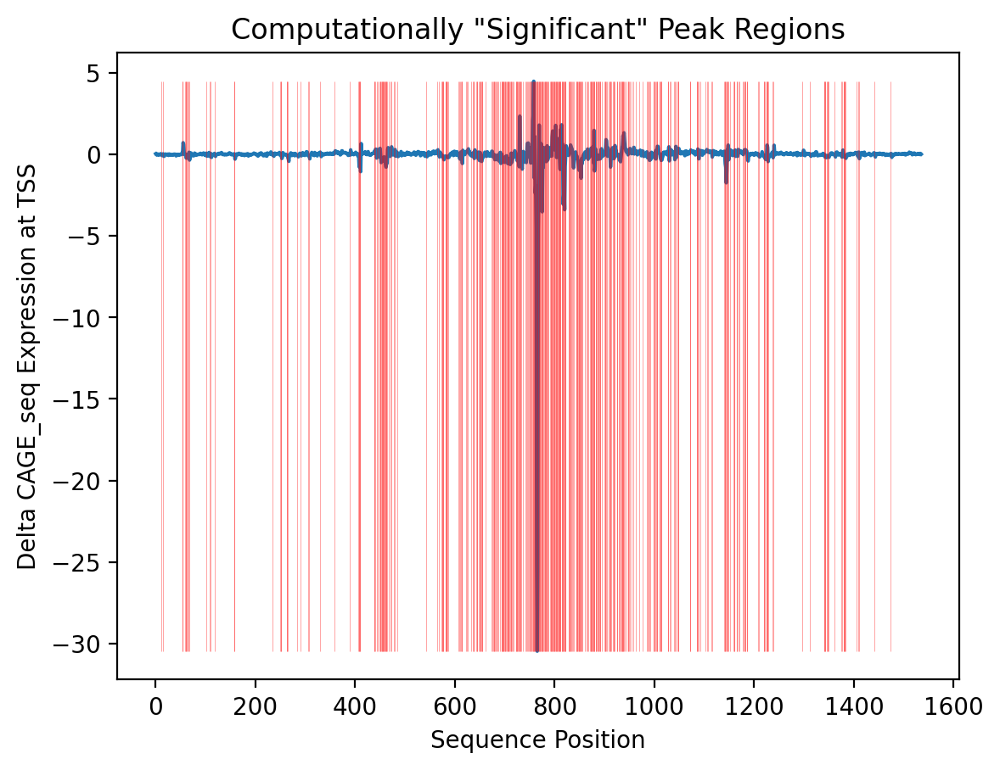

In [108]:
plt.plot(adjusted_deltas)
plt.vlines(significant_columns, 
           np.min(adjusted_deltas), 
           np.max(adjusted_deltas), 
           color='red',
           linewidth=0.25, 
           alpha=0.5)
plt.title('Computationally "Significant" Peak Regions')
plt.xlabel('Sequence Position')
plt.ylabel('Delta CAGE_seq Expression at TSS')
plt.show()

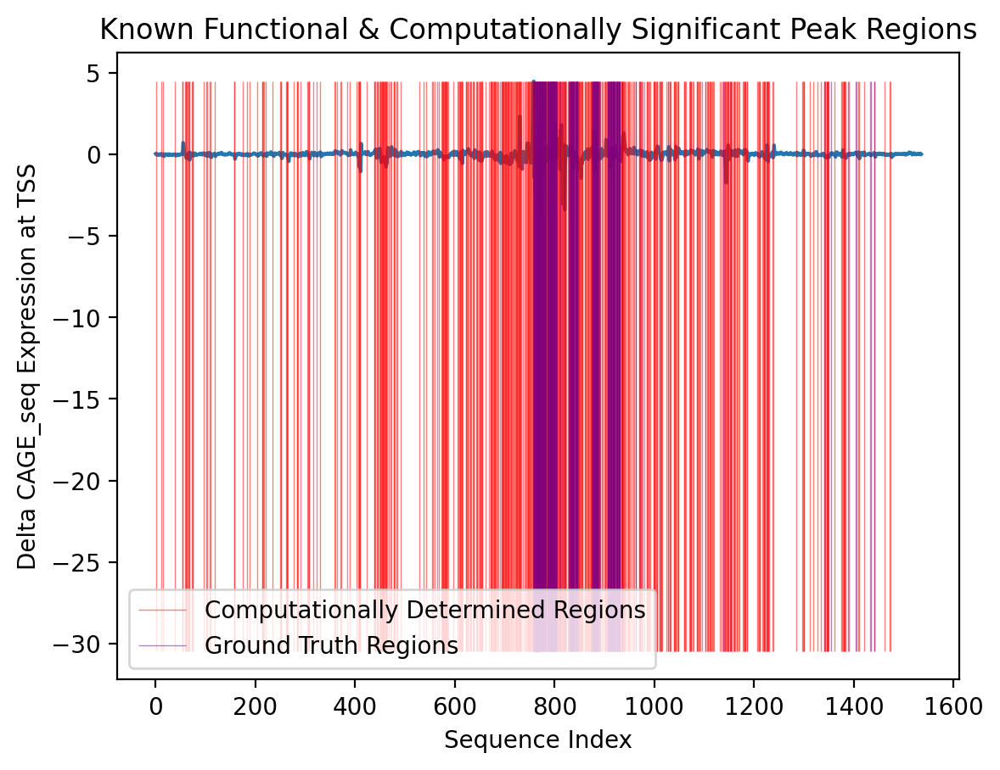

In [109]:
plt.plot(adjusted_deltas)
plt.vlines(significant_q, 
           np.min(adjusted_deltas), 
           np.max(adjusted_deltas), 
           color='red',
           linewidth=0.5, 
           alpha=0.5,
           label = 'Computationally Determined Regions')
plt.vlines(adjusted_regions,
           np.min(deltas), 
           np.max(deltas), 
           color='purple',
           linewidth=0.5, 
           alpha=0.5, 
           label ='Ground Truth Regions')
plt.title('Known Functional & Computationally Significant Peak Regions')
plt.xlabel('Sequence Index')
plt.ylabel('Delta CAGE_seq Expression at TSS')
plt.legend(loc ='lower left')
plt.show()

In [110]:
common_elements = [item for item in significant_q if item in relics_array]

print(f"Elements in computed regions that are also in ground truth regions: {common_elements}")

Elements in computed regions that are also in ground truth regions: [757, 758, 759, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 776, 778, 779, 780, 781, 782, 783, 785, 786, 788, 789, 791, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 805, 811, 820, 829, 830, 832, 833, 835, 836, 838, 842, 843, 844, 845, 847, 875, 876, 877, 879, 880, 882, 883, 884, 885, 886, 888, 910, 911, 914, 917, 918, 919, 925, 926, 928, 930, 931, 936, 1138, 1153, 1347, 1441]


In [111]:
adjusted_regions

,start,end
0,757,758
1,758,759
2,759,761
3,761,762
4,762,763
...,...,...
92,963,973
95,1138,1153
100,1388,1403
101,1435,1441


In [112]:
relics_array

array([[ 757,  758],
       [ 758,  759],
       [ 759,  761],
       [ 761,  762],
       [ 762,  763],
       [ 763,  764],
       [ 764,  765],
       [ 765,  766],
       [ 766,  767],
       [ 767,  768],
       [ 768,  769],
       [ 769,  770],
       [ 770,  771],
       [ 771,  772],
       [ 772,  773],
       [ 773,  774],
       [ 774,  774],
       [ 774,  776],
       [ 776,  777],
       [ 777,  778],
       [ 778,  779],
       [ 779,  780],
       [ 780,  781],
       [ 781,  782],
       [ 782,  783],
       [ 785,  786],
       [ 786,  787],
       [ 787,  788],
       [ 788,  789],
       [ 789,  790],
       [ 790,  791],
       [ 791,  793],
       [ 793,  794],
       [ 794,  795],
       [ 795,  796],
       [ 796,  797],
       [ 797,  798],
       [ 798,  798],
       [ 798,  799],
       [ 799,  800],
       [ 800,  801],
       [ 801,  802],
       [ 802,  803],
       [ 803,  805],
       [ 829,  830],
       [ 830,  832],
       [ 832,  833],
       [ 833,

In [113]:
pairs

[(757, 758),
 (758, 759),
 (759, 761),
 (761, 762),
 (762, 763),
 (763, 764),
 (764, 765),
 (765, 766),
 (766, 767),
 (767, 768),
 (768, 769),
 (769, 770),
 (770, 771),
 (771, 772),
 (772, 773),
 (773, 774),
 (774, 774),
 (774, 776),
 (776, 777),
 (777, 778),
 (778, 779),
 (779, 780),
 (780, 781),
 (781, 782),
 (782, 783),
 (785, 786),
 (786, 787),
 (787, 788),
 (788, 789),
 (789, 790),
 (790, 791),
 (791, 793),
 (793, 794),
 (794, 795),
 (795, 796),
 (796, 797),
 (797, 798),
 (798, 798),
 (798, 799),
 (799, 800),
 (800, 801),
 (801, 802),
 (802, 803),
 (803, 805),
 (829, 830),
 (830, 832),
 (832, 833),
 (833, 834),
 (834, 835),
 (835, 836),
 (836, 837),
 (837, 838),
 (838, 840),
 (840, 842),
 (842, 843),
 (843, 844),
 (844, 845),
 (845, 847),
 (875, 876),
 (876, 877),
 (877, 879),
 (879, 880),
 (880, 881),
 (881, 882),
 (882, 883),
 (883, 884),
 (884, 885),
 (885, 886),
 (886, 888),
 (888, 889),
 (906, 906),
 (906, 909),
 (909, 910),
 (910, 911),
 (911, 913),
 (913, 914),
 (914, 915),

In [114]:
# Function to fill in integers between start and end values in each range
def fill_in_range_regions(region_list):
    filled_numbers = []

    for start, end in region_list:
        filled_numbers.extend(range(start, end + 1))

    return filled_numbers

# List of regions as tuples (start, end)
regions = pairs

# Fill in the integers between ranges in each region
filled_integers = fill_in_range_regions(regions)

print(f"Integers filled within the ranges: {filled_integers}")


Integers filled within the ranges: [757, 758, 758, 759, 759, 760, 761, 761, 762, 762, 763, 763, 764, 764, 765, 765, 766, 766, 767, 767, 768, 768, 769, 769, 770, 770, 771, 771, 772, 772, 773, 773, 774, 774, 774, 775, 776, 776, 777, 777, 778, 778, 779, 779, 780, 780, 781, 781, 782, 782, 783, 785, 786, 786, 787, 787, 788, 788, 789, 789, 790, 790, 791, 791, 792, 793, 793, 794, 794, 795, 795, 796, 796, 797, 797, 798, 798, 798, 799, 799, 800, 800, 801, 801, 802, 802, 803, 803, 804, 805, 829, 830, 830, 831, 832, 832, 833, 833, 834, 834, 835, 835, 836, 836, 837, 837, 838, 838, 839, 840, 840, 841, 842, 842, 843, 843, 844, 844, 845, 845, 846, 847, 875, 876, 876, 877, 877, 878, 879, 879, 880, 880, 881, 881, 882, 882, 883, 883, 884, 884, 885, 885, 886, 886, 887, 888, 888, 889, 906, 906, 907, 908, 909, 909, 910, 910, 911, 911, 912, 913, 913, 914, 914, 915, 915, 916, 916, 917, 917, 918, 918, 919, 919, 920, 920, 921, 922, 922, 923, 923, 924, 925, 925, 926, 926, 927, 927, 928, 928, 929, 930, 930, 931,

In [115]:
filled_integers = list(set(filled_integers))
sorted(filled_integers)

[757,
 758,
 759,
 760,
 761,
 762,
 763,
 764,
 765,
 766,
 767,
 768,
 769,
 770,
 771,
 772,
 773,
 774,
 775,
 776,
 777,
 778,
 779,
 780,
 781,
 782,
 783,
 785,
 786,
 787,
 788,
 789,
 790,
 791,
 792,
 793,
 794,
 795,
 796,
 797,
 798,
 799,
 800,
 801,
 802,
 803,
 804,
 805,
 811,
 812,
 813,
 814,
 815,
 816,
 817,
 818,
 819,
 820,
 829,
 830,
 831,
 832,
 833,
 834,
 835,
 836,
 837,
 838,
 839,
 840,
 841,
 842,
 843,
 844,
 845,
 846,
 847,
 875,
 876,
 877,
 878,
 879,
 880,
 881,
 882,
 883,
 884,
 885,
 886,
 887,
 888,
 889,
 906,
 907,
 908,
 909,
 910,
 911,
 912,
 913,
 914,
 915,
 916,
 917,
 918,
 919,
 920,
 921,
 922,
 923,
 924,
 925,
 926,
 927,
 928,
 929,
 930,
 931,
 932,
 933,
 934,
 935,
 936,
 963,
 964,
 965,
 966,
 967,
 968,
 969,
 970,
 971,
 972,
 973,
 1138,
 1139,
 1140,
 1141,
 1142,
 1143,
 1144,
 1145,
 1146,
 1147,
 1148,
 1149,
 1150,
 1151,
 1152,
 1153,
 1347,
 1348,
 1349,
 1350,
 1351,
 1352,
 1353,
 1354,
 1388,
 1389,
 1390,
 1391,


In [117]:
relics_fs_coordinates = filled_integers

In [118]:
relics_non_functional = []

for i in range(1536):
    if i not in relics_fs_coordinates:
        relics_non_functional.append(i)

print(relics_non_functional)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [119]:
len(filled_integers)

181

## log odds ratio

In [120]:
significant_q

array([   1,   11,   15,   39,   53,   54,   59,   60,   61,   62,   64,
         66,   67,   68,   73,   74,   75,   97,  101,  103,  108,  110,
        118,  157,  158,  175,  184,  188,  203,  213,  214,  215,  218,
        221,  235,  250,  251,  252,  262,  263,  264,  265,  277,  283,
        284,  285,  290,  304,  306,  307,  308,  316,  322,  330,  358,
        361,  363,  371,  372,  384,  389,  403,  406,  407,  408,  409,
        410,  424,  438,  439,  441,  443,  445,  446,  448,  450,  451,
        452,  453,  454,  455,  456,  457,  458,  459,  460,  461,  462,
        463,  464,  468,  471,  473,  477,  478,  479,  483,  484,  491,
        529,  538,  542,  554,  556,  560,  564,  567,  573,  574,  575,
        576,  577,  578,  579,  580,  581,  582,  583,  584,  585,  586,
        597,  606,  607,  608,  610,  611,  612,  613,  614,  615,  622,
        623,  624,  625,  627,  630,  631,  632,  636,  637,  638,  642,
        644,  645,  647,  650,  651,  652,  653,  6

In [121]:
experimental_fs_coordinates = significant_q

In [122]:
# A
shared_fs = [item for item in experimental_fs_coordinates if item in relics_fs_coordinates]

print(f"Functional regions in computed regions that are also in ground truth regions: {shared_fs}")

Functional regions in computed regions that are also in ground truth regions: [757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 778, 779, 780, 781, 782, 783, 785, 786, 788, 789, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 811, 812, 813, 814, 815, 816, 817, 818, 819, 820, 829, 830, 831, 832, 833, 835, 836, 838, 839, 842, 843, 844, 845, 846, 847, 875, 876, 877, 878, 879, 880, 882, 883, 884, 885, 886, 887, 888, 907, 908, 910, 911, 912, 914, 917, 918, 919, 921, 924, 925, 926, 928, 929, 930, 931, 933, 934, 935, 936, 969, 970, 971, 972, 1138, 1140, 1141, 1142, 1143, 1144, 1146, 1147, 1148, 1149, 1151, 1152, 1153, 1347, 1348, 1349, 1390, 1441]


In [123]:
experimental_non_functional = []

for i in range(1536):
    if i not in experimental_fs_coordinates:
        experimental_non_functional.append(i)

print(experimental_non_functional)

[0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 55, 56, 57, 58, 63, 65, 69, 70, 71, 72, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 98, 99, 100, 102, 104, 105, 106, 107, 109, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 176, 177, 178, 179, 180, 181, 182, 183, 185, 186, 187, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 204, 205, 206, 207, 208, 209, 210, 211, 212, 216, 217, 219, 220, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 253, 254, 255, 

In [124]:
relics_non_functional = []

for i in range(1536):
    if i not in relics_fs_coordinates:
        relics_non_functional.append(i)

print(relics_non_functional)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [125]:
# C
relics_exp_non_functional = [item for item in experimental_non_functional if item in relics_fs_coordinates]

print(f"Experimentally non functional regions that are actually ground truth regions: {relics_exp_non_functional}")

Experimentally non functional regions that are actually ground truth regions: [777, 787, 790, 834, 837, 840, 841, 881, 889, 906, 909, 913, 915, 916, 920, 922, 923, 927, 932, 963, 964, 965, 966, 967, 968, 973, 1139, 1145, 1150, 1350, 1351, 1352, 1353, 1354, 1388, 1389, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1435, 1436, 1437, 1438, 1439, 1440]


In [126]:
# B
non_relics_exp_functional = [item for item in experimental_fs_coordinates if item in relics_non_functional]

print(f"Experimentally functional regions that are insignificant RELICS regions: {relics_exp_non_functional}")

Experimentally functional regions that are insignificant RELICS regions: [777, 787, 790, 834, 837, 840, 841, 881, 889, 906, 909, 913, 915, 916, 920, 922, 923, 927, 932, 963, 964, 965, 966, 967, 968, 973, 1139, 1145, 1150, 1350, 1351, 1352, 1353, 1354, 1388, 1389, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1435, 1436, 1437, 1438, 1439, 1440]


In [127]:
# D: Non-functional coordinates in computed regions that are also in ground truth regions
shared_non_fs = [item for item in experimental_non_functional if item in relics_non_functional]
print(f"Non-functional coordinates in computed regions that are also in ground truth regions: {shared_non_fs}")

Non-functional coordinates in computed regions that are also in ground truth regions: [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 55, 56, 57, 58, 63, 65, 69, 70, 71, 72, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 98, 99, 100, 102, 104, 105, 106, 107, 109, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 176, 177, 178, 179, 180, 181, 182, 183, 185, 186, 187, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 204, 205, 206, 207, 208, 209, 210, 211, 212, 216, 217, 219, 220, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234,

In [128]:
print(len(experimental_fs_coordinates))
print(len(experimental_non_functional))
print(len(relics_fs_coordinates))
print(len(relics_non_functional))

541
995
181
1355


In [129]:
print(len(shared_fs))
print(len(non_relics_exp_functional))
print(len(relics_exp_non_functional))
print(len(shared_non_fs))

126
415
55
940


In [130]:
125+407

532

In [131]:
56+948

1004

In [132]:
A = len(shared_fs) / 532
B = len(non_relics_exp_functional) / 532
C = len(relics_exp_non_functional) / 1004
D = len(shared_non_fs) / 1004

In [133]:
table = [A, B], [C, D]
table

([0.23684210526315788, 0.7800751879699248],
 [0.054780876494023904, 0.9362549800796812])

In [134]:
from scipy.stats import fisher_exact

fisher_exact(table, alternative='two-sided')

SignificanceResult(statistic=nan, pvalue=1.0)

In [135]:
df = pd.DataFrame(table)
df.columns = ['CRISPR functional', 'CRISPR non functional']
df.index = ['in silico functional', 'in silico non functional']
df

,CRISPR functional,CRISPR non functional
in silico functional,0.236842,0.780075
in silico non functional,0.054781,0.936255


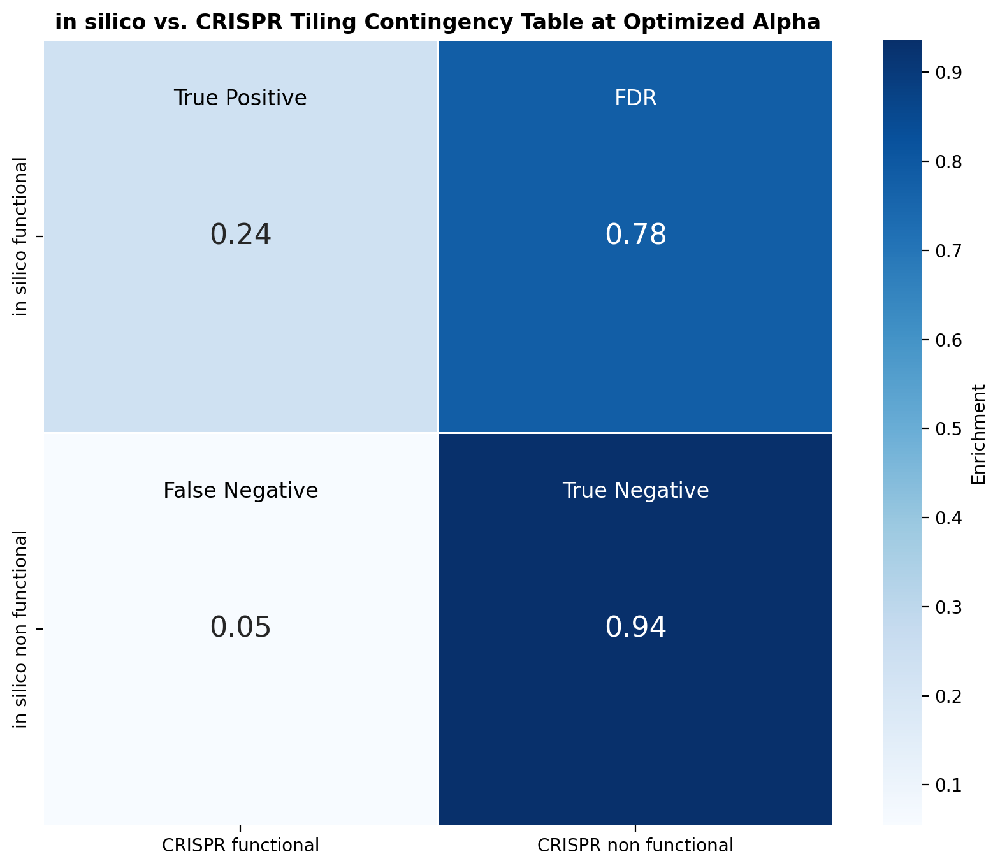

In [136]:
# Create the heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(df, annot=True, cmap='Blues', fmt=".2f", linewidths=.5,
                 cbar_kws={'label': 'Enrichment'}, annot_kws={"size": 16})

plt.title('in silico vs. CRISPR Tiling Contingency Table at Optimized Alpha', fontweight='bold')

labels = [['True Positive', 'FDR'],
          ['False Negative', 'True Negative']]

# Label colors
colors = [['black', 'white'],
          ['black', 'white']]

# Add the labels above the numbers with specified colors
for i in range(len(labels)):
    for j in range(len(labels[i])):
        ax.text(j + 0.5, i + 0.15, labels[i][j], ha='center', va='center', 
                fontsize=12, color=colors[i][j])
        
# Show the plot
plt.show()


In [137]:
from scipy.stats import fisher_exact

fisher_exact(table, alternative='two-sided')

SignificanceResult(statistic=nan, pvalue=1.0)

## genome cut proportion

In [138]:
type(experimental_fs_coordinates)

numpy.ndarray

In [139]:
total_functional_coordindates = []

total_functional_coordindates = list(experimental_fs_coordinates) + list(relics_fs_coordinates)

In [140]:
total_functional_coordindates = list(set(total_functional_coordindates))
total_functional_coordindates.sort()
print(total_functional_coordindates)

[1, 11, 15, 39, 53, 54, 59, 60, 61, 62, 64, 66, 67, 68, 73, 74, 75, 97, 101, 103, 108, 110, 118, 157, 158, 175, 184, 188, 203, 213, 214, 215, 218, 221, 235, 250, 251, 252, 262, 263, 264, 265, 277, 283, 284, 285, 290, 304, 306, 307, 308, 316, 322, 330, 358, 361, 363, 371, 372, 384, 389, 403, 406, 407, 408, 409, 410, 424, 438, 439, 441, 443, 445, 446, 448, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 468, 471, 473, 477, 478, 479, 483, 484, 491, 529, 538, 542, 554, 556, 560, 564, 567, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582, 583, 584, 585, 586, 597, 606, 607, 608, 610, 611, 612, 613, 614, 615, 622, 623, 624, 625, 627, 630, 631, 632, 636, 637, 638, 642, 644, 645, 647, 650, 651, 652, 653, 654, 655, 661, 668, 671, 672, 673, 674, 675, 676, 678, 679, 680, 681, 682, 683, 686, 687, 690, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 712, 713, 715, 716, 718, 719, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731

In [141]:
from collections import Counter

def has_duplicates(total_functional_coordindates):
    return any(count > 1 for count in Counter(total_functional_coordindates).values())

print(has_duplicates(total_functional_coordindates)) 

False


In [142]:
proportion_kept = len(total_functional_coordindates) / 1536 

In [143]:
proportion_kept

0.3880208333333333

In [144]:
SEQUENCE_LENGTH / 2

196608.0

In [145]:
196608 * proportion_kept

76288.0

## determining optimized alpha

In [146]:
experimental_fs_coordinates = significant_columns

In [147]:
significant_columns

array([  11,   15,   53,   54,   59,   60,   61,   62,   64,   66,   68,
        101,  108,  110,  118,  157,  158,  235,  250,  251,  252,  263,
        264,  265,  284,  290,  306,  307,  330,  358,  389,  406,  407,
        408,  409,  410,  438,  439,  441,  443,  446,  448,  450,  451,
        452,  453,  454,  455,  456,  457,  458,  459,  460,  461,  462,
        463,  464,  468,  471,  473,  478,  479,  484,  542,  564,  567,
        573,  574,  575,  576,  577,  581,  582,  583,  584,  585,  586,
        607,  608,  611,  612,  613,  614,  622,  624,  625,  632,  636,
        637,  638,  642,  644,  645,  647,  650,  651,  652,  653,  654,
        655,  661,  674,  675,  676,  678,  679,  680,  682,  683,  686,
        687,  690,  693,  694,  695,  696,  697,  698,  699,  700,  701,
        703,  704,  705,  706,  707,  708,  709,  710,  712,  713,  715,
        716,  718,  722,  723,  724,  725,  726,  727,  728,  729,  731,
        732,  733,  737,  741,  743,  745,  747,  7

In [148]:
relics_fs_coordinates = filled_integers

In [149]:
# A
shared_fs = [item for item in experimental_fs_coordinates if item in relics_fs_coordinates]

print(f"Functional regions in computed regions that are also in ground truth regions: {shared_fs}")

Functional regions in computed regions that are also in ground truth regions: [757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 778, 779, 780, 781, 782, 783, 785, 786, 788, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 811, 812, 814, 815, 816, 817, 818, 819, 820, 829, 830, 831, 832, 833, 835, 836, 839, 843, 844, 845, 846, 847, 875, 876, 877, 878, 879, 880, 882, 883, 884, 886, 887, 888, 908, 910, 911, 912, 914, 917, 918, 919, 921, 925, 926, 928, 930, 931, 933, 934, 935, 936, 969, 1140, 1141, 1142, 1143, 1144, 1146, 1147, 1148, 1151, 1347, 1348, 1349, 1441]


In [150]:
experimental_non_functional = []

for i in range(1536):
    if i not in experimental_fs_coordinates:
        experimental_non_functional.append(i)

print(experimental_non_functional)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 55, 56, 57, 58, 63, 65, 67, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 102, 103, 104, 105, 106, 107, 109, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 236, 237

In [151]:
relics_non_functional = []

for i in range(1536):
    if i not in relics_fs_coordinates:
        relics_non_functional.append(i)

print(relics_non_functional)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [152]:
# D
shared_non_fs = [item for item in experimental_non_functional if item in relics_non_functional]

print(f"Non functional coordinates in computed regions that are also in ground truth regions: {shared_non_fs}")

Non functional coordinates in computed regions that are also in ground truth regions: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 55, 56, 57, 58, 63, 65, 67, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 102, 103, 104, 105, 106, 107, 109, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 21

In [153]:
# C
# good that this is high (kinda the point of doing this??? not sure if this is a good measure)
relics_exp_non_functional = [item for item in experimental_non_functional if item in relics_fs_coordinates]

print(f"Experimentally non functional regions that are actually ground truth regions: {relics_exp_non_functional}")

Experimentally non functional regions that are actually ground truth regions: [777, 787, 789, 790, 813, 834, 837, 838, 840, 841, 842, 881, 885, 889, 906, 907, 909, 913, 915, 916, 920, 922, 923, 924, 927, 929, 932, 963, 964, 965, 966, 967, 968, 970, 971, 972, 973, 1138, 1139, 1145, 1149, 1150, 1152, 1153, 1350, 1351, 1352, 1353, 1354, 1388, 1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1435, 1436, 1437, 1438, 1439, 1440]


In [154]:
# B
non_relics_exp_functional = [item for item in experimental_fs_coordinates if item in relics_non_functional]

print(f"Experimentally functional regions that are insignificant RELICS regions: {relics_exp_non_functional}")

Experimentally functional regions that are insignificant RELICS regions: [777, 787, 789, 790, 813, 834, 837, 838, 840, 841, 842, 881, 885, 889, 906, 907, 909, 913, 915, 916, 920, 922, 923, 924, 927, 929, 932, 963, 964, 965, 966, 967, 968, 970, 971, 972, 973, 1138, 1139, 1145, 1149, 1150, 1152, 1153, 1350, 1351, 1352, 1353, 1354, 1388, 1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1435, 1436, 1437, 1438, 1439, 1440]


In [155]:
print(len(experimental_fs_coordinates))
print(len(experimental_non_functional))
print(len(relics_fs_coordinates))
print(len(relics_non_functional))

398
1138
181
1355


In [156]:
print(len(shared_fs))
print(len(non_relics_exp_functional))
print(len(relics_exp_non_functional))
print(len(shared_non_fs))

110
288
71
1067


In [157]:
110+71

181

In [158]:
283+1072

1355

In [166]:
A = len(shared_fs) / 181
B = len(non_relics_exp_functional) / 1355
C = len(relics_exp_non_functional) / 181
D = len(shared_non_fs) / 1355

prop_table = [A, B], [C, D]

In [167]:
A = len(shared_fs)
B = len(non_relics_exp_functional)
C = len(relics_exp_non_functional)
D = len(shared_non_fs)

table = [A, B], [C, D]
table

from scipy.stats import fisher_exact

fisher_exact(table, alternative='two-sided')

SignificanceResult(statistic=5.739925665101722, pvalue=2.1701394965642982e-26)

In [162]:
from scipy.stats import fisher_exact

fisher_exact(table, alternative='two-sided')

SignificanceResult(statistic=5.739925665101722, pvalue=2.1701394965642982e-26)

In [169]:
df = pd.DataFrame(prop_table)
df.columns = ['RELICS functional', 'RELICS non functional']
df.index = ['in silico functional', 'in silico non functional']
df

,RELICS functional,RELICS non functional
in silico functional,0.607735,0.212546
in silico non functional,0.392265,0.787454


In [170]:
df = pd.DataFrame(table)
df.columns = ['RELICS functional', 'RELICS non functional']
df.index = ['in silico functional', 'in silico non functional']
df

,RELICS functional,RELICS non functional
in silico functional,110,288
in silico non functional,71,1067


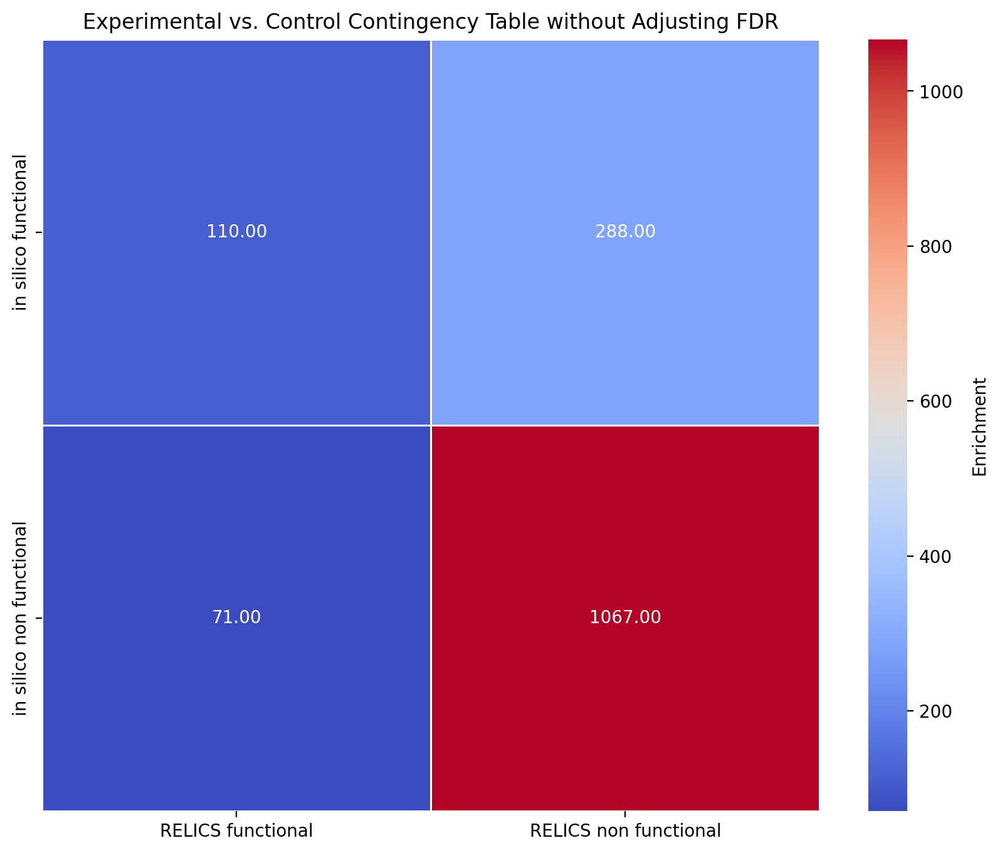

In [171]:
# Create the heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(df, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, cbar_kws={'label': 'Enrichment'})  

plt.title('Experimental vs. Control Contingency Table without Adjusting FDR')

# Show the plot
plt.show()


In [172]:
import statsmodels
from statsmodels.stats.multitest import multipletests
import numpy as np
from scipy.stats import fisher_exact

# Define a list of different alpha values
alpha_values = [0.05, 0.1, 0.15, 0.2]


for alpha in alpha_values:
    # Perform the FDR correction
    FDR = multipletests(p_values, 
                        alpha=alpha, 
                        method='fdr_bh', 
                        maxiter=1, 
                        is_sorted=False, 
                        returnsorted=False)
    
    # Extract q-values
    q_values = FDR[1]

    # Find significant q-values with the threshold of the current alpha value
    significant_q = np.where(q_values <= alpha)[0]

    # The significant column indexes are the experimental functional coordinates
    experimental_fs_coordinates = significant_q

    # Output the significant column indexes
    print(f"Alpha: {alpha}")
    print(f"Significant column indexes (q_values <= {alpha}): {significant_q}")

    # A: Functional regions in computed regions that are also in ground truth regions
    shared_fs = [item for item in experimental_fs_coordinates if item in relics_fs_coordinates]
    print(f"Functional regions in computed regions that are also in ground truth regions: {shared_fs}")

    # Experimental non-functional regions
    experimental_non_functional = [i for i in range(1536) if i not in experimental_fs_coordinates]
    print(f"Experimental non-functional regions: {experimental_non_functional}")

    # D: Non-functional coordinates in computed regions that are also in ground truth regions
    shared_non_fs = [item for item in experimental_non_functional if item in relics_non_functional]
    print(f"Non-functional coordinates in computed regions that are also in ground truth regions: {shared_non_fs}")

    # C: Experimentally non-functional regions that are actually ground truth regions
    relics_exp_non_functional = [item for item in experimental_non_functional if item in relics_fs_coordinates]
    print(f"Experimentally non-functional regions that are actually ground truth regions: {relics_exp_non_functional}")

    # B: Experimentally functional regions that are insignificant RELICS regions
    non_relics_exp_functional = [item for item in experimental_fs_coordinates if item in relics_non_functional]
    print(f"Experimentally functional regions that are insignificant RELICS regions: {non_relics_exp_functional}")

    # Calculate A, B, C, D
    A = len(shared_fs)
    B = len(non_relics_exp_functional)
    C = len(relics_exp_non_functional)
    D = len(shared_non_fs)

    # Create contingency table
    table = [[A, B], [C, D]]

    # Perform Fisher's Exact Test
    fisher_result = fisher_exact(table, alternative='two-sided')

    print(f"Contingency Table: {table}")
    print(f"Fisher's Exact Test result for alpha {alpha}: {fisher_result}")

    print("\n")


Alpha: 0.05
Significant column indexes (q_values <= 0.05): [  53   54   66  265  406  407  408  409  410  450  451  452  455  457
  459  460  461  462  613  647  651  652  678  683  687  690  693  694
  698  701  704  705  707  708  709  710  712  713  723  726  727  728
  731  732  733  737  741  743  745  750  752  754  755  756  757  758
  759  760  761  762  763  764  765  766  767  768  769  770  771  772
  773  774  775  781  783  784  793  794  795  799  800  801  803  804
  807  809  810  811  812  814  815  816  817  818  819  821  822  830
  836  844  845  846  847  848  849  850  851  853  875  876  877  878
  879  901  902  905  910  919  930  934  935  936  937  938  988  990
 1001 1004 1005 1013 1027 1028 1039 1041 1140 1141 1142 1143 1146 1185
 1186 1224 1226 1238]
Functional regions in computed regions that are also in ground truth regions: [757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 781, 783, 793, 794, 795, 799, 800, 

In [173]:
import statsmodels
from statsmodels.stats.multitest import multipletests
import numpy as np
from scipy.stats import fisher_exact

# Define a list of different alpha values
alpha_values = np.arange(0.05, 0.26, 0.01)

# Define costs for Type I and Type II errors
c1 = 0  # False positive
c2 = 1  # False negative

costs = []

results = []  

for alpha in alpha_values:
    # Perform the FDR correction
    FDR = multipletests(p_values, 
                        alpha=alpha, 
                        method='fdr_bh', 
                        maxiter=1, 
                        is_sorted=False, 
                        returnsorted=False)
    
    # Extract q-values
    q_values = FDR[1]

    # Find significant q-values with the threshold of the current alpha value
    significant_q = np.where(q_values <= alpha)[0]

    # The significant column indexes are the experimental functional coordinates
    experimental_fs_coordinates = significant_q

    # Output the significant column indexes
    print(f"Alpha: {alpha}")

    # A: Functional regions in computed regions that are also in ground truth regions
    shared_fs = [item for item in experimental_fs_coordinates if item in relics_fs_coordinates]

    # Experimental non-functional regions
    experimental_non_functional = [i for i in range(1536) if i not in experimental_fs_coordinates]

    # D: Non-functional coordinates in computed regions that are also in ground truth regions
    shared_non_fs = [item for item in experimental_non_functional if item in relics_non_functional]

    # C: Experimentally non-functional regions that are actually ground truth regions
    relics_exp_non_functional = [item for item in experimental_non_functional if item in relics_fs_coordinates]

    # B: Experimentally functional regions that are insignificant RELICS regions
    non_relics_exp_functional = [item for item in experimental_fs_coordinates if item in relics_non_functional]

    # Calculate A, B, C, D
    A = len(shared_fs)
    B = len(non_relics_exp_functional)
    C = len(relics_exp_non_functional)
    D = len(shared_non_fs)

    # Create contingency table
    table = [[A, B], [C, D]]

    # Perform Fisher's Exact Test
    fisher_result = fisher_exact(table, alternative='two-sided')
    fisher_statistic = fisher_result[0]  
    fisher_p_value = fisher_result[1]  # P-value to assess significance

    print(f"Contingency Table: {table}")
    print(f"Fisher's Exact Test result for alpha {alpha}: {fisher_result}")

    # Calculate Type I and Type II errors
    type_i_errors = B
    type_ii_errors = C

    # Calculate total cost
    total_cost = c1 * type_i_errors + c2 * type_ii_errors
    results.append((alpha, total_cost, fisher_p_value, fisher_statistic))

    print(f"Total cost for alpha {alpha}: {total_cost}")
    print(f"Fisher's Exact Test p-value for alpha {alpha}: {fisher_p_value}\n")

# Find the alpha with the minimum cost and consider Fisher's Exact Test p-value
optimal_result = max(results, key=lambda x: (x[1] == min([r[1] for r in results]), x[3]))

optimal_alpha = optimal_result[0]
min_cost = optimal_result[1]
min_p_value = optimal_result[2]
fisher_statistic_val = optimal_result[3]

print(f"Optimal alpha value: {optimal_alpha} with minimum cost: {min_cost} and Fisher's p-value: {min_p_value}")
print(f"Fisher's Exact Test statistic for optimal alpha: {fisher_statistic_val}")

Alpha: 0.05
Contingency Table: [[59, 85], [122, 1270]]
Fisher's Exact Test result for alpha 0.05: SignificanceResult(statistic=7.225650916104146, pvalue=9.855643393255336e-22)
Total cost for alpha 0.05: 122
Fisher's Exact Test p-value for alpha 0.05: 9.855643393255336e-22

Alpha: 0.060000000000000005
Contingency Table: [[67, 114], [114, 1241]]
Fisher's Exact Test result for alpha 0.060000000000000005: SignificanceResult(statistic=6.397891658971991, pvalue=6.280119024927217e-22)
Total cost for alpha 0.060000000000000005: 114
Fisher's Exact Test p-value for alpha 0.060000000000000005: 6.280119024927217e-22

Alpha: 0.07
Contingency Table: [[73, 133], [108, 1222]]
Fisher's Exact Test result for alpha 0.07: SignificanceResult(statistic=6.2103870788081315, pvalue=8.62556562517126e-23)
Total cost for alpha 0.07: 108
Fisher's Exact Test p-value for alpha 0.07: 8.62556562517126e-23

Alpha: 0.08000000000000002
Contingency Table: [[82, 145], [99, 1210]]
Fisher's Exact Test result for alpha 0.0800

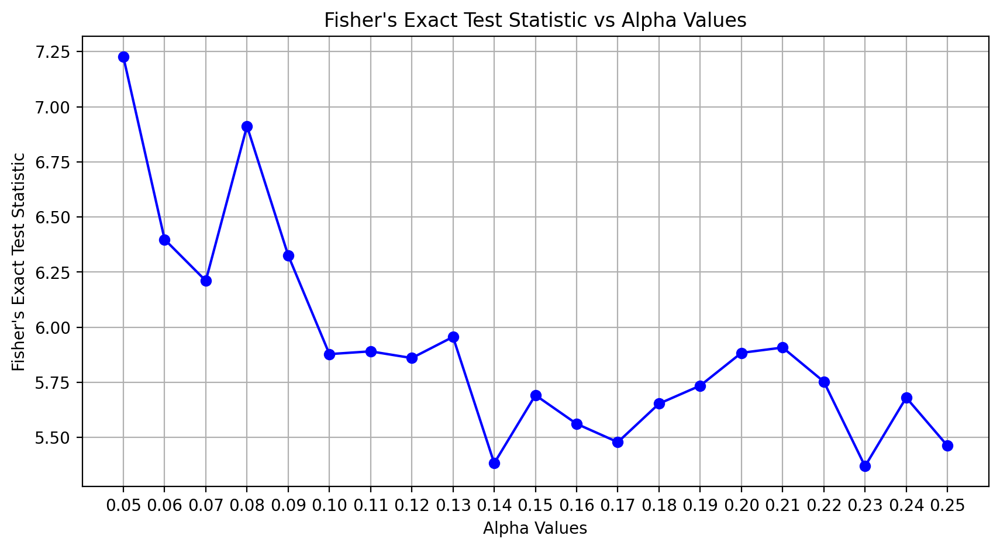

Optimal alpha value: 0.2 and Fisher's p-value: 3.963016083801681e-27
Fisher's Exact Test statistic for optimal alpha: 5.883365484493249
Alpha: 0.05, Fisher Statistic: 7.225650916104146, P-value: 9.855643393255336e-22
Alpha: 0.060000000000000005, Fisher Statistic: 6.397891658971991, P-value: 6.280119024927217e-22
Alpha: 0.07, Fisher Statistic: 6.2103870788081315, P-value: 8.62556562517126e-23
Alpha: 0.08000000000000002, Fisher Statistic: 6.911877394636015, P-value: 7.435912853221799e-27
Alpha: 0.09000000000000001, Fisher Statistic: 6.325573979591836, P-value: 3.2375795844308445e-25
Alpha: 0.1, Fisher Statistic: 5.877710629221472, P-value: 7.150594114452674e-24
Alpha: 0.11000000000000001, Fisher Statistic: 5.890205827937096, P-value: 2.0261541811854914e-24
Alpha: 0.12000000000000001, Fisher Statistic: 5.859771286231884, P-value: 1.2647336428087797e-24
Alpha: 0.13, Fisher Statistic: 5.9557371654234315, P-value: 7.430932083910123e-26
Alpha: 0.14, Fisher Statistic: 5.382728410513141, P-valu

In [175]:
import statsmodels
from statsmodels.stats.multitest import multipletests
import numpy as np
from scipy.stats import fisher_exact
import matplotlib.pyplot as plt

# Generate alpha values from 0.05 to 0.25 in steps of 0.01
alpha_values = np.arange(0.05, 0.26, 0.01)

results = []  # Initialize results as a list
fisher_statistics = []  # List to store Fisher statistics for plotting
fisher_results = []  # List to store Fisher result (statistic, p-value)

for alpha in alpha_values:
    # Perform the FDR correction
    FDR = multipletests(p_values,
                        alpha=alpha,
                        method='fdr_bh',
                        maxiter=1,
                        is_sorted=False,
                        returnsorted=False)

    # Extract q-values
    q_values = FDR[1]

    # Find significant q-values with the threshold of the current alpha value
    significant_q = np.where(q_values <= alpha)[0]

    # The significant column indexes are the experimental functional coordinates
    experimental_fs_coordinates = significant_q

    # A: Functional regions intersecting with ground truth
    shared_fs = [item for item in experimental_fs_coordinates if item in relics_fs_coordinates]

    # Experimental non-functional regions
    experimental_non_functional = [i for i in range(1536) if i not in experimental_fs_coordinates]

    # D: Non-functional coordinates in computed regions that are also in ground truth regions
    shared_non_fs = [item for item in experimental_non_functional if item in relics_non_functional]

    # C: Experimentally non-functional regions that are actually ground truth regions
    relics_exp_non_functional = [item for item in experimental_non_functional if item in relics_fs_coordinates]

    # B: Experimentally functional regions that are insignificant RELICS regions
    non_relics_exp_functional = [item for item in experimental_fs_coordinates if item in relics_non_functional]

    # Calculate A, B, C, D
    A = len(shared_fs)
    B = len(non_relics_exp_functional)
    C = len(relics_exp_non_functional)
    D = len(shared_non_fs)

    left = A + C
    right = B + D

    # Calculate A, B, C, D
    A = len(shared_fs)
    B = len(non_relics_exp_functional)
    C = len(relics_exp_non_functional)
    D = len(shared_non_fs)

    # Create contingency table
    table = [[A, B], [C, D]]

    # Perform Fisher's Exact Test
    fisher_result = fisher_exact(table, alternative='two-sided')
    fisher_statistic = fisher_result[0]  # Odds ratio
    fisher_p_value = fisher_result[1]    # P-value to assess significance


    fisher_results.append((fisher_statistic, fisher_p_value))

    # Append Fisher statistic for plotting
    fisher_statistics.append(fisher_statistic if not np.isnan(fisher_statistic) else 0)

    # Append to results for further analysis
    results.append((alpha, fisher_p_value, fisher_statistic))  # Append result

# Convert fisher_statistics to NumPy array for easy manipulation (if needed)
fisher_statistics = np.array(fisher_statistics)

# Plot the Fisher statistics against alpha values
plt.figure(figsize=(10, 5))
plt.plot(alpha_values, fisher_statistics, marker='o', linestyle='-', color='b')
plt.title("Fisher's Exact Test Statistic vs Alpha Values")
plt.xlabel("Alpha Values")
plt.ylabel("Fisher's Exact Test Statistic")
plt.grid()
plt.xticks(alpha_values)  # Set x-ticks to be the alpha values for clarity
plt.show()

optimal_result = max(results, key=lambda x: (x[1] == min([r[1] for r in results]), x[2]))

optimal_alpha = optimal_result[0]
min_p_value = optimal_result[1]
fisher_statistic_val = optimal_result[2]

# Print optimal result details
print(f"Optimal alpha value: {optimal_alpha} and Fisher's p-value: {min_p_value}")
print(f"Fisher's Exact Test statistic for optimal alpha: {fisher_statistic_val}")

# Print all Fisher results for review
for idx, (statistic, p_value) in enumerate(fisher_results):
    print(f"Alpha: {alpha_values[idx]}, Fisher Statistic: {statistic}, P-value: {p_value}")


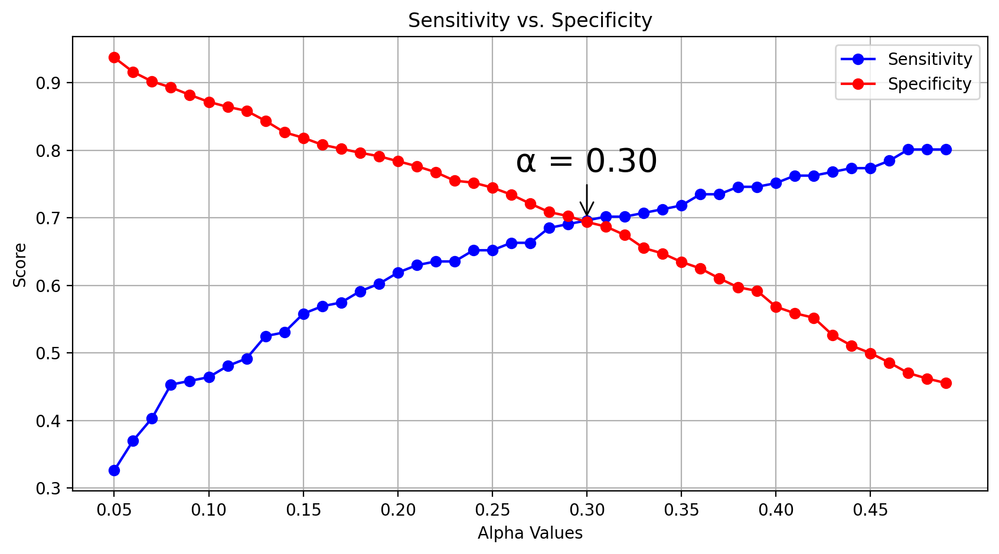

In [176]:
import statsmodels
from statsmodels.stats.multitest import multipletests
import numpy as np
from scipy.stats import fisher_exact
import matplotlib.pyplot as plt

# Generate alpha values from 0.05 to 0.25 in steps of 0.01
alpha_values = np.arange(0.05, 0.5, 0.01)

results = []  # Initialize results as a list

for alpha in alpha_values:
    # Perform the FDR correction
    FDR = multipletests(p_values,
                        alpha=alpha,
                        method='fdr_bh',
                        maxiter=1,
                        is_sorted=False,
                        returnsorted=False)

    # Extract q-values
    q_values = FDR[1]

    # Find significant q-values with the threshold of the current alpha value
    significant_q = np.where(q_values <= alpha)[0]

    # The significant column indexes are the experimental functional coordinates
    experimental_fs_coordinates = significant_q

    # A: Functional regions intersecting with ground truth
    shared_fs = [item for item in experimental_fs_coordinates if item in relics_fs_coordinates]

    # Experimental non-functional regions
    experimental_non_functional = [i for i in range(1536) if i not in experimental_fs_coordinates]

    # D: Non-functional coordinates in computed regions that are also in ground truth regions
    shared_non_fs = [item for item in experimental_non_functional if item in relics_non_functional]

    # C: Experimentally non-functional regions that are actually ground truth regions
    relics_exp_non_functional = [item for item in experimental_non_functional if item in relics_fs_coordinates]

    # B: Experimentally functional regions that are insignificant RELICS regions
    non_relics_exp_functional = [item for item in experimental_fs_coordinates if item in relics_non_functional]

    # Calculate A, B, C, D
    A = len(shared_fs)
    B = len(non_relics_exp_functional)
    C = len(relics_exp_non_functional)
    D = len(shared_non_fs)

    left = A + C
    right = B + D

    # Normalize A and D
    A = len(shared_fs) / left if left > 0 else 0  # Prevent division by zero
    D = len(shared_non_fs) / right if right > 0 else 0  # Prevent division by zero
   
    # Append to results for further analysis
    results.append((alpha, A, D))  # Append result

# Extract values for plotting
alpha_vals = [result[0] for result in results]  # Extract alpha values from results
A_values = [result[1] for result in results]     # Extract A values from results
D_values = [result[2] for result in results]     # Extract D values from results

# Plot the Fisher statistics against alpha values
plt.figure(figsize=(10, 5))

# Plotting A values
plt.plot(alpha_vals, A_values, marker='o', linestyle='-', color='b', label='Sensitivity')

# Plotting D values
plt.plot(alpha_vals, D_values, marker='o', linestyle='-', color='r', label='Specificity')

# Find intersection point
intersection_index = np.argmin(np.abs(np.array(A_values) - np.array(D_values)))
intersection_alpha = alpha_vals[intersection_index]
intersection_A = A_values[intersection_index]
intersection_D = D_values[intersection_index]

# Annotate the intersection point
plt.annotate(f'α = {intersection_alpha:.2f}', 
             (intersection_alpha, intersection_A), 
             textcoords="offset points",
             xytext=(0,30),  # Offset the label above the intersection point
             ha='center',
             fontsize=20,
             color='black',
             arrowprops=dict(arrowstyle='->', color='black'))

plt.title("Sensitivity vs. Specificity")
plt.xlabel("Alpha Values")
plt.ylabel("Score")
plt.grid()
plt.xticks(np.arange(0.05, 0.5, 0.05))

# Adding a legend to differentiate between A and D values
plt.legend()

# Show the plot
plt.show()